# UKBB Exploratory Data Analysis

## Setup 

### Imports

In [18]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from env.imports import *

/ext3/miniconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
2025-02-27 14:07:44.567756: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-27 14:07:47.826645: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-27 14:07:52.054218: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
from models import *
from data import * 
from env import *
from sim import *

# data load
from data.data_load import load_transcriptome, load_connectome, load_coords
from data.data_viz import plot_connectome, plot_connectome_with_labels, plot_transcriptome


### Paths and metadata

In [4]:
# Set paths
GeneEx2Conn_path = os.path.normpath(os.getcwd())
UKBB_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/Penn_UKBB_data/'
print(GeneEx2Conn_path)
print(UKBB_path)

UKBB_demographics = pd.read_csv(UKBB_path + '/metadata/UKBB_MasterList_DemogInfo_part.csv')
unique_subject_ids = list(set([x.split('-')[1] for x in os.listdir(UKBB_path + '/XCP_D/') if x.startswith('sub-')]))
print(f"Number of scans: {len(unique_subject_ids)}")

with open(GeneEx2Conn_path + '/data/UKBB/UKBB_fMRI_subids.txt', 'r') as f:
    subjects_all = [line.strip() for line in f.readlines()]

with open(GeneEx2Conn_path + '/data/UKBB/UKBB_fMRI_subids_clean.txt', 'r') as f:
    subjects_clean = [line.strip() for line in f.readlines()]

print(f"Number of subjects with valid scans: {len(subjects_all)}")
print(f"Number of clean subjects: {len(subjects_clean)}")


schaef156_atlas_path = UKBB_path + '/atlases/atlas-4S156Parcels/atlas-4S156Parcels_dseg.tsv'
schaef156_atlas_info = pd.read_csv(schaef156_atlas_path, sep='\t')
schaef156_labels = schaef156_atlas_info['label'].tolist()

schaef456_atlas_path = UKBB_path + '/atlases/atlas-4S456Parcels/atlas-4S456Parcels_dseg.tsv'
schaef456_atlas_info = pd.read_csv(schaef456_atlas_path, sep='\t')
schaef456_labels = schaef456_atlas_info['label'].tolist()

schaef156_atlas_info.loc[schaef156_atlas_info['atlas_name'] == 'Cerebellum', 'network_label'] = 'Cerebellum'
schaef156_atlas_info.loc[(schaef156_atlas_info['network_label'].isna()) & 
                        (schaef156_atlas_info['atlas_name'] != 'Cerebellum'), 'network_label'] = 'Subcortical'

schaef456_atlas_info.loc[schaef456_atlas_info['atlas_name'] == 'Cerebellum', 'network_label'] = 'Cerebellum'
schaef456_atlas_info.loc[(schaef456_atlas_info['network_label'].isna()) & 
                        (schaef456_atlas_info['atlas_name'] != 'Cerebellum'), 'network_label'] = 'Subcortical'

schaef156_labels = schaef156_atlas_info['label'].tolist()
schaef156_network_labels = schaef156_atlas_info['network_label'].values
schaef456_labels = schaef456_atlas_info['label'].tolist()
schaef456_network_labels = schaef456_atlas_info['network_label'].values



/scratch/asr655/neuroinformatics/GeneEx2Conn
/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/
Number of scans: 1959
Number of subjects with valid scans: 1817
Number of clean subjects: 1501


## Load data

### Load all subjects and generate population average connectomes

In [5]:
def compute_UKBB_population_average_connectome(subject_list, data_path, atlas_name='156', verbose=True):
    """
    Compute population average connectome from a list of subjects.
    
    Parameters
    ----------
    subject_list : list
        List of subject IDs
    data_path : str
        Path to data directory
    atlas_name : str, optional
        Atlas to use ('156' or '456'), by default '156'
    verbose : bool, optional
        Whether to print progress, by default True
        
    Returns
    -------
    tuple
        (population average connectome matrix,
         number of subjects skipped,
         number of connectomes with NaN values)
    """
    # Validate atlas name
    atlas_str = '4S156Parcels' if atlas_name == '156' else '4S456Parcels' if atlas_name == '456' else None
    if not atlas_str:
        raise ValueError(f"Unsupported atlas_name: {atlas_name}")

    # Initialize list to store connectomes
    connectomes = []
    n_skipped = 0

    # Collect all valid connectomes
    for i, subject_id in enumerate(subject_list):
        if verbose and i % 100 == 0:
            print(f"Loading subject {i}/{len(subject_list)}")
            
        # Get subject path
        subject_dir = os.path.join(data_path, 'XCP_D', f'sub-{subject_id}')
        if not os.path.exists(subject_dir):
            n_skipped += 1
            continue
            
        # Get session
        session_dirs = [d for d in os.listdir(subject_dir) if d.startswith('ses-')]
        if not session_dirs:
            n_skipped += 1
            continue
            
        # Get connectome path
        relmat_path = os.path.join(subject_dir, session_dirs[0], 'func',
            f'sub-{subject_id}_{session_dirs[0]}_task-rest_space-MNI152NLin6Asym_seg-{atlas_str}_stat-pearsoncorrelation_relmat.tsv')
        
        try:
            # Load connectome
            curr_mat = pd.read_csv(relmat_path, sep='\t', header=None).values[1:, 1:].astype(float)
            connectomes.append(curr_mat)
        except Exception as e:
            if verbose: 
                print(f"Error processing subject {subject_id}: {str(e)}")
            n_skipped += 1
            continue

    # Count connectomes with NaN values
    nan_count = sum(np.any(np.isnan(conn)) for conn in connectomes)
    if verbose:
        print(f"Number of connectomes with NaN values: {nan_count} out of {len(connectomes)} total connectomes")

    # Compute average
    pop_avg = np.nanmean(connectomes, axis=0)
    # pop_avg = np.mean(connectomes, axis=0) # drops any region with NaN
    
    return pop_avg, connectomes

In [6]:
UKBB_S156_connectome_mu, S156_connectomes = compute_UKBB_population_average_connectome(
    subject_list=subjects_all,
    atlas_name='156',
    data_path=UKBB_path
)

Loading subject 0/1817
Loading subject 100/1817
Loading subject 200/1817
Error processing subject 1030376: [Errno 2] No such file or directory: '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/XCP_D/sub-1030376/ses-20227/func/sub-1030376_ses-20227_task-rest_space-MNI152NLin6Asym_seg-4S156Parcels_stat-pearsoncorrelation_relmat.tsv'
Loading subject 300/1817
Error processing subject 1035201: [Errno 2] No such file or directory: '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/XCP_D/sub-1035201/ses-20227/func/sub-1035201_ses-20227_task-rest_space-MNI152NLin6Asym_seg-4S156Parcels_stat-pearsoncorrelation_relmat.tsv'
Loading subject 400/1817
Loading subject 500/1817
Loading subject 600/1817
Loading subject 700/1817
Loading subject 800/1817
Loading subject 900/1817
Loading subject 1000/1817
Error processing subject 1135018: [Errno 2] No such file or directory: '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/XCP_D/sub-1135018/ses-20227/func/su

In [7]:
# UKBB_S156_connectome_mu_clean, S156_connectomes_clean = compute_UKBB_population_average_connectome(
#     subject_list=subjects_clean,
#     atlas_name='156',
#     data_path=UKBB_path
# )

In [8]:
print(len(subjects_all))
print(len(S156_connectomes))

1817
1814


In [9]:
UKBB_S456_connectome_mu, S456_connectomes = compute_UKBB_population_average_connectome(
    subject_list=subjects_all,
    atlas_name='456',
    data_path=UKBB_path
)

Loading subject 0/1817
Loading subject 100/1817
Loading subject 200/1817
Error processing subject 1030376: [Errno 2] No such file or directory: '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/XCP_D/sub-1030376/ses-20227/func/sub-1030376_ses-20227_task-rest_space-MNI152NLin6Asym_seg-4S456Parcels_stat-pearsoncorrelation_relmat.tsv'
Loading subject 300/1817
Error processing subject 1035201: [Errno 2] No such file or directory: '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/XCP_D/sub-1035201/ses-20227/func/sub-1035201_ses-20227_task-rest_space-MNI152NLin6Asym_seg-4S456Parcels_stat-pearsoncorrelation_relmat.tsv'
Loading subject 400/1817
Loading subject 500/1817
Loading subject 600/1817
Loading subject 700/1817
Loading subject 800/1817
Loading subject 900/1817
Loading subject 1000/1817
Error processing subject 1135018: [Errno 2] No such file or directory: '/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/XCP_D/sub-1135018/ses-20227/func/su

In [10]:
# UKBB_S456_connectome_mu_clean, S456_connectomes_clean = compute_UKBB_population_average_connectome(
#     subject_list=subjects_clean,
#     atlas_name='456',
#     data_path=UKBB_path
# )


In [13]:
# Remove subjects that weren't processed
subjects_to_remove = ['1030376', '1035201', '1135018']
subjects_all = [s for s in subjects_all if s not in subjects_to_remove]
print(f"Removed {len(subjects_to_remove)} subjects that weren't processed")
print(f"New number of subjects: {len(subjects_all)}")

Removed 3 subjects that weren't processed
New number of subjects: 1814


In [14]:
print(len(subjects_all))
print(len(S156_connectomes))
print(len(S456_connectomes))

1814
1814
1814


In [15]:
def extract_upper_triangle_with_mask(matrix):
    """Extracts upper triangle and returns a mask of valid (non-NaN) values."""
    upper_triangle = matrix[np.triu_indices_from(matrix, k=1)]
    mask = ~np.isnan(upper_triangle)  # True if the value is NOT NaN
    return upper_triangle, mask

# Process S156 connectomes
S156_connectomes_upper = []
S156_masks = []

for matrix in S156_connectomes:
    upper_tri, mask = extract_upper_triangle_with_mask(matrix)
    S156_connectomes_upper.append(upper_tri)
    S156_masks.append(mask)

S156_connectomes_upper = np.array(S156_connectomes_upper)
S156_masks = np.array(S156_masks)

print(f"S156 connectomes shape: {S156_connectomes_upper.shape}")
print(f"S156 masks shape: {S156_masks.shape}")

# Process S456 connectomes 
S456_connectomes_upper = []
S456_masks = []

for matrix in S456_connectomes:
    upper_tri, mask = extract_upper_triangle_with_mask(matrix)
    S456_connectomes_upper.append(upper_tri)
    S456_masks.append(mask)

S456_connectomes_upper = np.array(S456_connectomes_upper)
S456_masks = np.array(S456_masks)

print(f"\nS456 connectomes shape: {S456_connectomes_upper.shape}")
print(f"S456 masks shape: {S456_masks.shape}")

# Create dictionaries to store subject IDs and their corresponding connectomes
S156_data = {
    'subject_ids': subjects_all[:len(S156_connectomes)],
    'connectomes_upper': S156_connectomes_upper,
    'masks': S156_masks
}

S456_data = {
    'subject_ids': subjects_all[:len(S456_connectomes)],
    'connectomes_upper': S456_connectomes_upper, 
    'masks': S456_masks
}

print("S156 data structure created with", len(S156_data['subject_ids']), "subjects")
print("S456 data structure created with", len(S456_data['subject_ids']), "subjects")

import os
import sys

# Calculate memory size of datasets in MB
S156_size_mb = (S156_data['connectomes_upper'].nbytes + 
                S156_data['masks'].nbytes + 
                sum(sys.getsizeof(id) for id in S156_data['subject_ids'])) / (1024 * 1024)

S456_size_mb = (S456_data['connectomes_upper'].nbytes + 
                S456_data['masks'].nbytes + 
                sum(sys.getsizeof(id) for id in S456_data['subject_ids'])) / (1024 * 1024)

print(f"S156 dataset size: {S156_size_mb:.2f} MB")
print(f"S456 dataset size: {S456_size_mb:.2f} MB")

S156 connectomes shape: (1814, 12090)
S156 masks shape: (1814, 12090)

S456 connectomes shape: (1814, 103740)
S456 masks shape: (1814, 103740)
S156 data structure created with 1814 subjects
S456 data structure created with 1814 subjects
S156 dataset size: 188.33 MB
S456 dataset size: 1615.30 MB


In [16]:
# Save data to .npy files for efficient storage and loading

# Create output directories if they don't exist
output_dir = UKBB_path + 'npy'
s156_dir = os.path.join(output_dir, 'S156')
s456_dir = os.path.join(output_dir, 'S456')
os.makedirs(s156_dir, exist_ok=True)
os.makedirs(s456_dir, exist_ok=True)

# Save S156 data
np.save(f'{s156_dir}/connectomes_upper.npy', S156_data['connectomes_upper'])
np.save(f'{s156_dir}/masks.npy', S156_data['masks'])
np.save(f'{s156_dir}/subject_ids.npy', np.array(S156_data['subject_ids']))

# Save S456 data 
np.save(f'{s456_dir}/connectomes_upper.npy', S456_data['connectomes_upper'])
np.save(f'{s456_dir}/masks.npy', S456_data['masks'])
np.save(f'{s456_dir}/subject_ids.npy', np.array(S456_data['subject_ids']))

print(f"Data saved to {output_dir}/")

Data saved to /scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/npy/


S156 shape: (12090,)
Number of upper triangle elements: 12090
{(0, 1): 0, (0, 2): 1, (0, 3): 2, (0, 4): 3, (0, 5): 4, (0, 6): 5, (0, 7): 6, (0, 8): 7, (0, 9): 8, (0, 10): 9, (0, 11): 10, (0, 12): 11, (0, 13): 12, (0, 14): 13, (0, 15): 14, (0, 16): 15, (0, 17): 16, (0, 18): 17, (0, 19): 18, (0, 20): 19, (0, 21): 20, (0, 22): 21, (0, 23): 22, (0, 24): 23, (0, 25): 24, (0, 26): 25, (0, 27): 26, (0, 28): 27, (0, 29): 28, (0, 30): 29, (0, 31): 30, (0, 32): 31, (0, 33): 32, (0, 34): 33, (0, 35): 34, (0, 36): 35, (0, 37): 36, (0, 38): 37, (0, 39): 38, (0, 40): 39, (0, 41): 40, (0, 42): 41, (0, 43): 42, (0, 44): 43, (0, 45): 44, (0, 46): 45, (0, 47): 46, (0, 48): 47, (0, 49): 48, (0, 50): 49, (0, 51): 50, (0, 52): 51, (0, 53): 52, (0, 54): 53, (0, 55): 54, (0, 56): 55, (0, 57): 56, (0, 58): 57, (0, 59): 58, (0, 60): 59, (0, 61): 60, (0, 62): 61, (0, 63): 62, (0, 64): 63, (0, 65): 64, (0, 66): 65, (0, 67): 66, (0, 68): 67, (0, 69): 68, (0, 70): 69, (0, 71): 70, (0, 72): 71, (0, 73): 72, (0, 74)

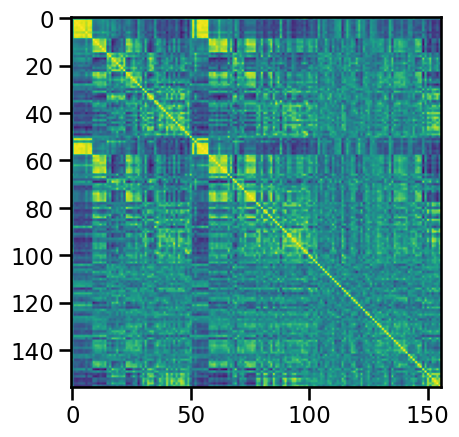

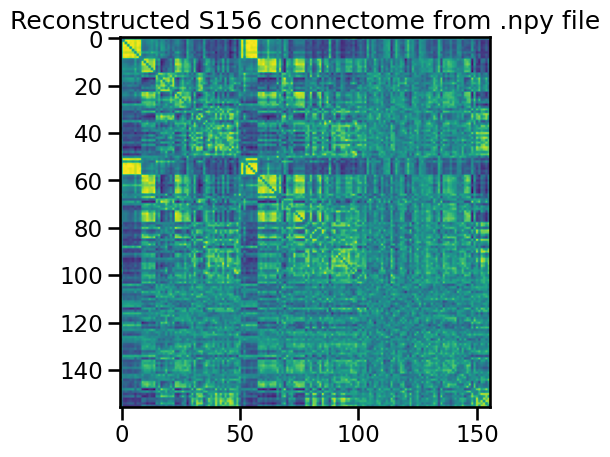

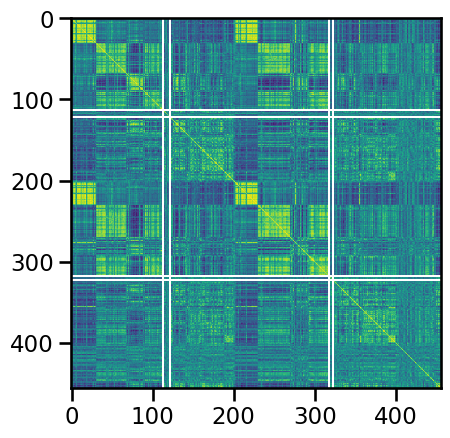

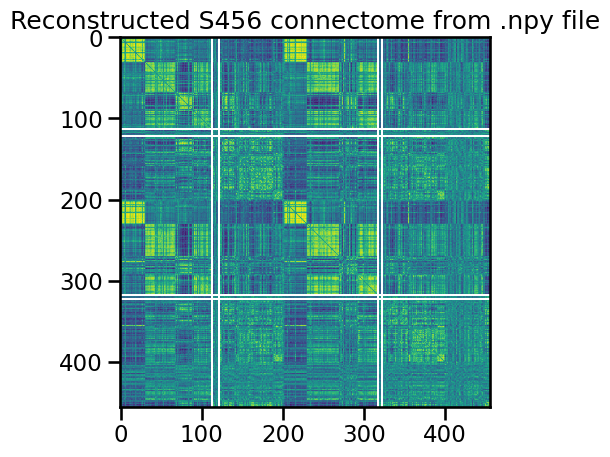

In [17]:
# Plot S156 connectome
sub0_connectome_156 = S156_connectomes[0]
plt.imshow(sub0_connectome_156)

# Load the first subject's connectome from the saved .npy file using memory mapping
S156_connectomes_upper = np.load(f'{s156_dir}/connectomes_upper.npy', mmap_mode='r')
sub0_connectome_from_file_156 = S156_connectomes_upper[0]
print("S156 shape:", sub0_connectome_from_file_156.shape)

# Reconstruct the full symmetric connectome from upper triangle
n = int((1 + np.sqrt(1 + 8*len(sub0_connectome_from_file_156)))/2)
reconstructed_156 = np.zeros((n,n))
idx = np.triu_indices(n, k=1)
reconstructed_156[idx] = sub0_connectome_from_file_156
reconstructed_156 = reconstructed_156 + reconstructed_156.T

plt.figure()
plt.imshow(reconstructed_156)
plt.title("Reconstructed S156 connectome from .npy file")

# Get indices of upper triangle
n = int((1 + np.sqrt(1 + 8*len(sub0_connectome_from_file_156)))/2)
triu_rows, triu_cols = np.triu_indices(n, k=1)

# Create dictionary mapping (row,col) tuples to 1D array indices
idx_map_156 = {(i,j): idx for idx, (i,j) in enumerate(zip(triu_rows, triu_cols))}
print(f"Number of upper triangle elements: {len(idx_map_156)}")
print(idx_map_156)

# Save index mapping dictionary to file
np.save(f'{s156_dir}/upper_triangle_index_map.npy', idx_map_156)
print(f"Saved upper triangle index mapping to {s156_dir}/upper_triangle_index_map.npy")

# Check all values match between reconstructed and memory mapped
all_match = True
for i in range(n):
    for j in range(i+1, n):  # Only check upper triangle
        # Get value from original connectome
        orig_value = reconstructed_156[i,j]
        
        # Get value from memory mapped file using index map
        mapped_idx = idx_map_156[(i,j)]
        mmap_value = sub0_connectome_from_file_156[mapped_idx]
        
        if not np.allclose(orig_value, mmap_value):
            print(f"Mismatch at edge ({i},{j}):")
            print(f"Original value: {orig_value:.4f}")
            print(f"Memory mapped value: {mmap_value:.4f}")
            all_match = False
            break
    if not all_match:
        break

print("\nChecking all values in upper triangle:")
print(f"All values match: {all_match}")

# Plot S456 connectome
sub0_connectome_456 = S456_connectomes[0]
plt.figure()
plt.imshow(sub0_connectome_456)

# Load the first subject's connectome from the saved .npy file using memory mapping
S456_connectomes_upper = np.load(f'{s456_dir}/connectomes_upper.npy', mmap_mode='r')
sub0_connectome_from_file_456 = S456_connectomes_upper[0]
print("S456 shape:", sub0_connectome_from_file_456.shape)

# Reconstruct the full symmetric connectome from upper triangle
n = int((1 + np.sqrt(1 + 8*len(sub0_connectome_from_file_456)))/2)
reconstructed_456 = np.zeros((n,n))
idx = np.triu_indices(n, k=1)
reconstructed_456[idx] = sub0_connectome_from_file_456
reconstructed_456 = reconstructed_456 + reconstructed_456.T

plt.figure()
plt.imshow(reconstructed_456)
plt.title("Reconstructed S456 connectome from .npy file")

# Get indices of upper triangle
n = int((1 + np.sqrt(1 + 8*len(sub0_connectome_from_file_456)))/2)
triu_rows, triu_cols = np.triu_indices(n, k=1)

# Create dictionary mapping (row,col) tuples to 1D array indices
idx_map_456 = {(i,j): idx for idx, (i,j) in enumerate(zip(triu_rows, triu_cols))}
print(f"Number of upper triangle elements: {len(idx_map_456)}")
print(idx_map_456)

# Save index mapping dictionary to file
np.save(f'{s456_dir}/upper_triangle_index_map.npy', idx_map_456)
print(f"Saved upper triangle index mapping to {s456_dir}/upper_triangle_index_map.npy")

# Check all values match between reconstructed and memory mapped
all_match = True
for i in range(n):
    for j in range(i+1, n):  # Only check upper triangle
        # Get value from original connectome
        orig_value = reconstructed_456[i,j]
        
        # Get value from memory mapped file using index map
        mapped_idx = idx_map_456[(i,j)]
        mmap_value = sub0_connectome_from_file_456[mapped_idx]
        
        if not np.allclose(orig_value, mmap_value):
            print(f"Mismatch at edge ({i},{j}):")
            print(f"Original value: {orig_value:.4f}")
            print(f"Memory mapped value: {mmap_value:.4f}")
            all_match = False
            break
    if not all_match:
        break

print("\nChecking all values in upper triangle:")
print(f"All values match: {all_match}")


In [9]:
# Flatten and correlate clean vs original average connectomes
try:
    flat_clean = UKBB_S156_connectome_mu_clean.flatten()
    flat_orig = UKBB_S156_connectome_mu.flatten()
    corr = np.corrcoef(flat_clean, flat_orig)[0,1]
    print(f"Correlation between clean and original average connectomes (S156): {corr:.3f}")
except:
    print("S156 clean connectome not computed")

# Flatten and correlate clean vs original average connectomes
try:
    flat_clean = UKBB_S456_connectome_mu_clean.flatten()
    flat_orig = UKBB_S456_connectome_mu.flatten()
    corr = np.corrcoef(flat_clean, flat_orig)[0,1]
    print(f"Correlation between clean and original average connectomes (S456): {corr:.3f}")
except:
    print("S456 clean connectome not computed")

S156 clean connectome not computed
S456 clean connectome not computed


### Plot random connectomes

In [59]:
def plot_random_connectomes(connectomes, n_rows, max_rois):
    """
    Plot a grid of random connectomes from the dataset.
    
    Args:
        connectomes: List of connectome matrices
        n_rows: Number of rows/columns in the grid (total plots will be n_rows^2)
        max_rois: Maximum number of ROIs to show in each connectome plot
    """
    # Create a figure with n_rows x n_rows subplots
    fig, axes = plt.subplots(n_rows, n_rows, figsize=(2*n_rows, 2*n_rows))
    
    # Convert list to numpy array and get random indices
    connectome_array = np.array(connectomes)
    n_plots = n_rows * n_rows
    random_indices = np.random.choice(len(connectome_array), size=n_plots, replace=False)
    
    # Plot each connectome in the grid
    for idx, ax in enumerate(axes.flat):
        # Get random connectome and plot first max_rois x max_rois portion
        connectome = connectome_array[random_indices[idx]][:max_rois, :max_rois]
        im = ax.imshow(connectome, cmap='RdBu_r')
        ax.axis('off')  # Turn off axis labels
    
    # Add a colorbar that applies to all subplots
    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    
    plt.suptitle(f'{n_plots} Random UKBB Cortical Connectomes (rsFC)', y=0.92)
    plt.show()

In [16]:
def plot_connectome_with_networks(connectome_mu, network_labels=None, n_rois=None, title=None):
    """
    Plot a connectome matrix with optional network labels and size limit.
    
    Args:
        connectome_mu: Average connectome matrix to plot
        network_labels: Optional list of network labels for each ROI
        n_rois: Optional number of ROIs to display (will show first n_rois x n_rois portion)
        title: Optional title for the plot. If None, uses default title.
    """
    plt.figure(figsize=(12, 10), dpi=200)
    
    # Limit connectome size if specified
    if n_rois is not None:
        connectome_mu = connectome_mu[:n_rois, :n_rois]
        if network_labels is not None:
            network_labels = network_labels[:n_rois]
    
    # Create the heatmap
    im = plt.imshow(connectome_mu, cmap='RdBu_r')
    plt.colorbar()

    if network_labels is not None:
        # Draw lines between different adjacent labels
        prev_label = network_labels[0]
        for i in range(1, len(network_labels)):
            if network_labels[i] != prev_label:
                plt.axhline(y=i-0.5, color='black', linewidth=0.5)
                plt.axvline(x=i-0.5, color='black', linewidth=0.5)
                prev_label = network_labels[i]
        
        # Create tick positions and labels
        tick_positions = []
        tick_labels = []
        start_idx = 0
        prev_label = network_labels[0]
        
        for i in range(1, len(network_labels)):
            if network_labels[i] != prev_label:
                tick_positions.append((start_idx + i - 1) / 2)
                tick_labels.append(prev_label)
                start_idx = i
                prev_label = network_labels[i]
        
        # Add the last group
        tick_positions.append((start_idx + len(network_labels) - 1) / 2)
        tick_labels.append(prev_label)

        plt.xticks(tick_positions, tick_labels, rotation=45, ha='right')
        plt.yticks(tick_positions, tick_labels)

    else:
        # Add numerical ticks every 20 ROIs (or 10 if total ROIs <= 100)
        total_rois = connectome_mu.shape[0]
        tick_interval = 20 if total_rois <= 200 else 50
        tick_positions = np.arange(0, total_rois, tick_interval)
        plt.xticks(tick_positions, tick_positions)
        plt.yticks(tick_positions, tick_positions)

    if title is None:
        title = 'Average Cortical Connectome (rsFC)'
    plt.title(title)
    plt.tight_layout()
    plt.show()


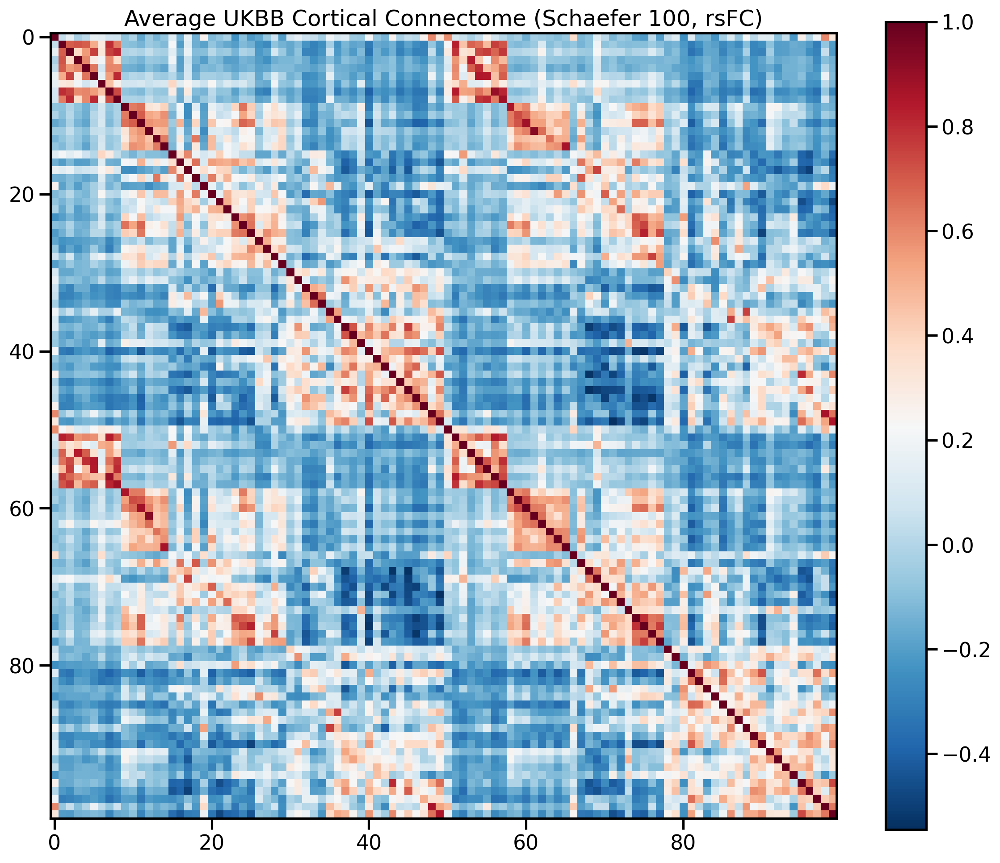

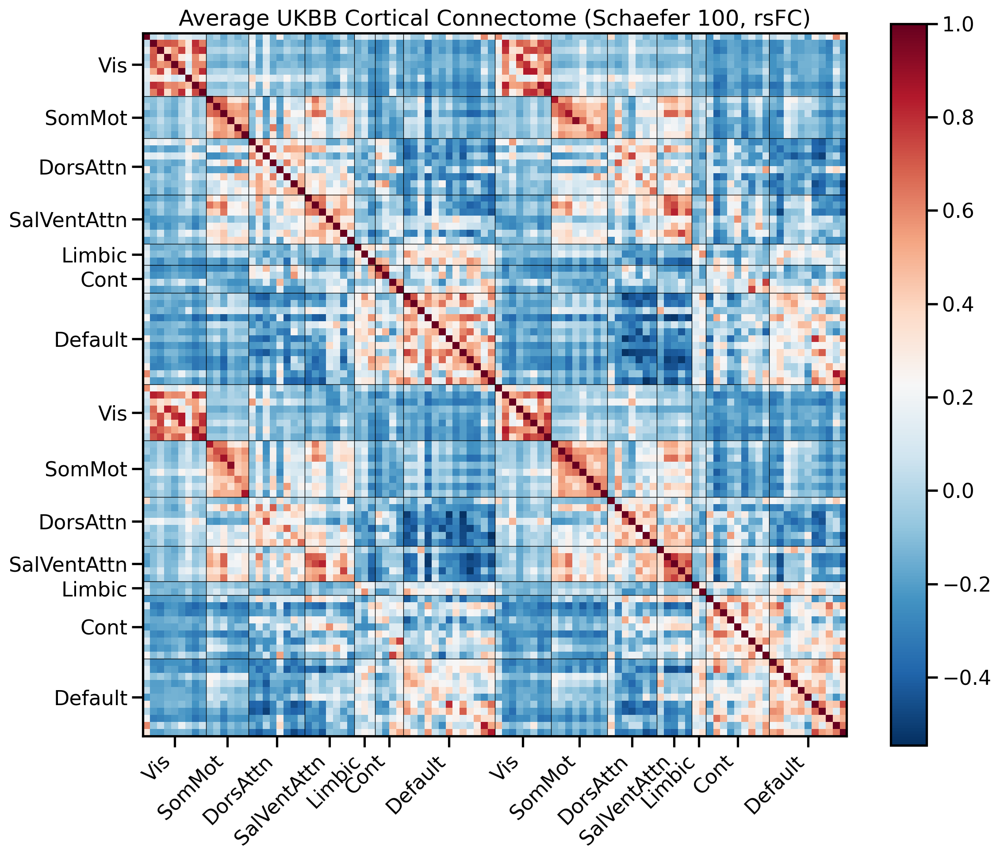

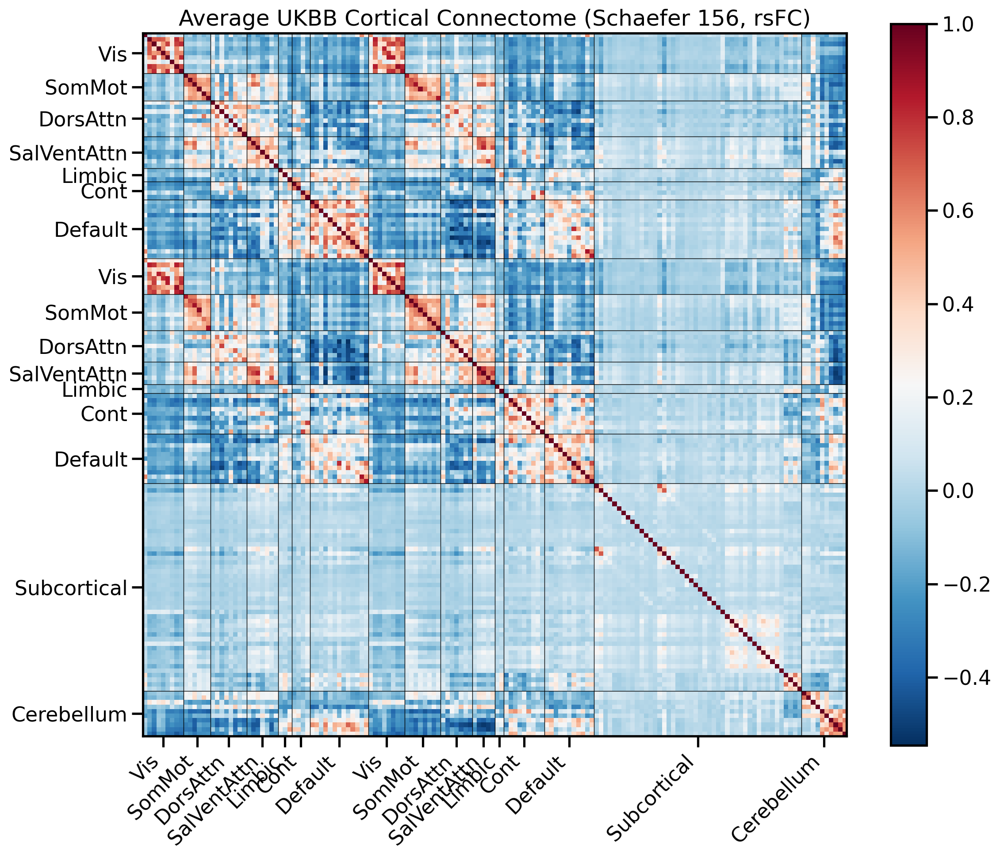

In [17]:
plot_connectome_with_networks(UKBB_S156_connectome_mu, network_labels=None, n_rois=100, title='Average UKBB Cortical Connectome (Schaefer 100, rsFC)')
plot_connectome_with_networks(UKBB_S156_connectome_mu, network_labels=schaef156_network_labels, n_rois=100, title='Average UKBB Cortical Connectome (Schaefer 100, rsFC)')
plot_connectome_with_networks(UKBB_S156_connectome_mu, network_labels=schaef156_network_labels, n_rois=156, title='Average UKBB Cortical Connectome (Schaefer 156, rsFC)')


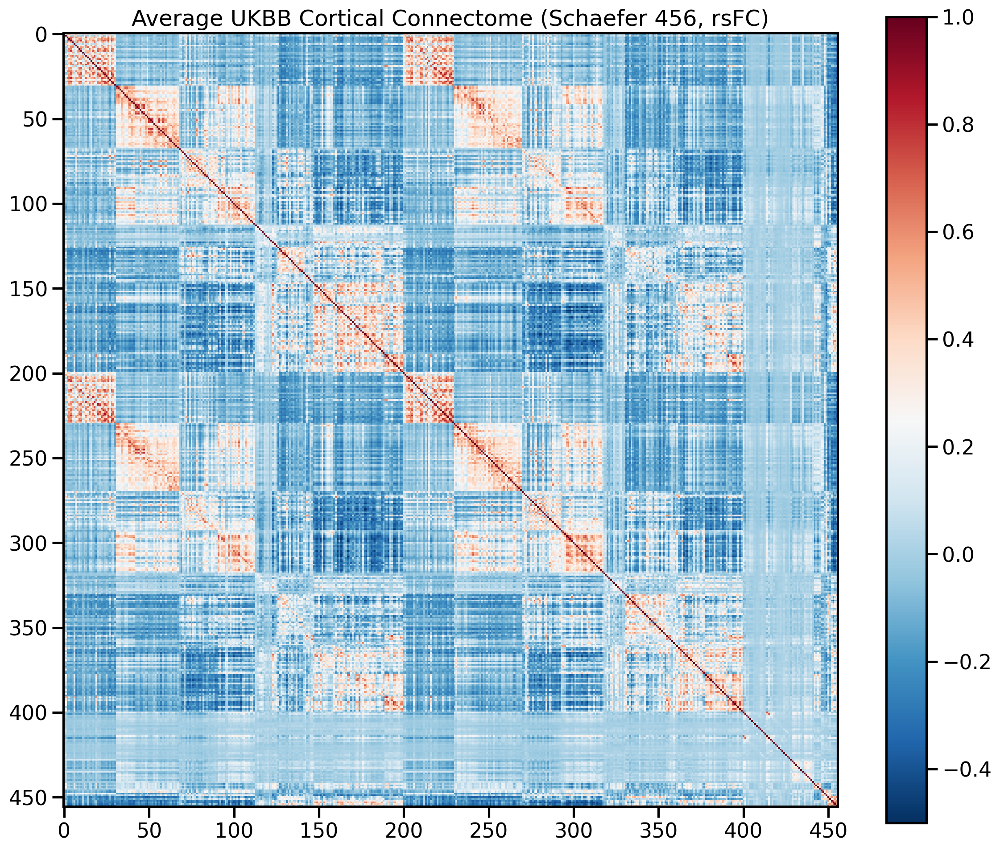

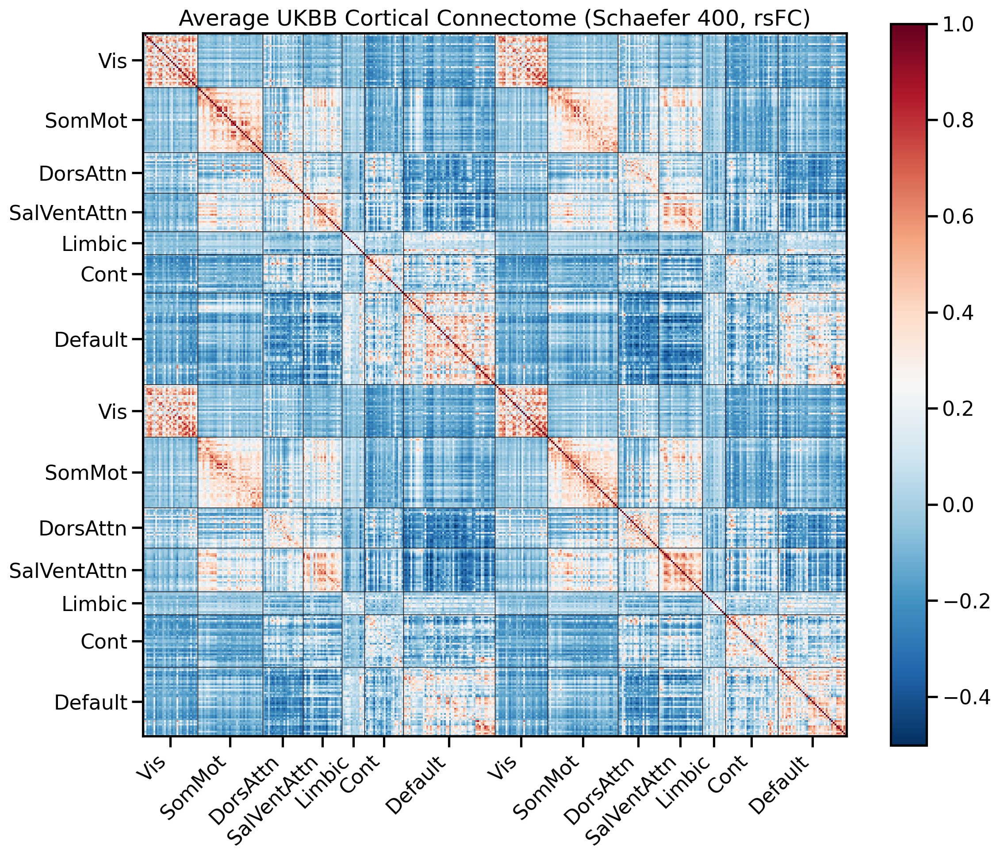

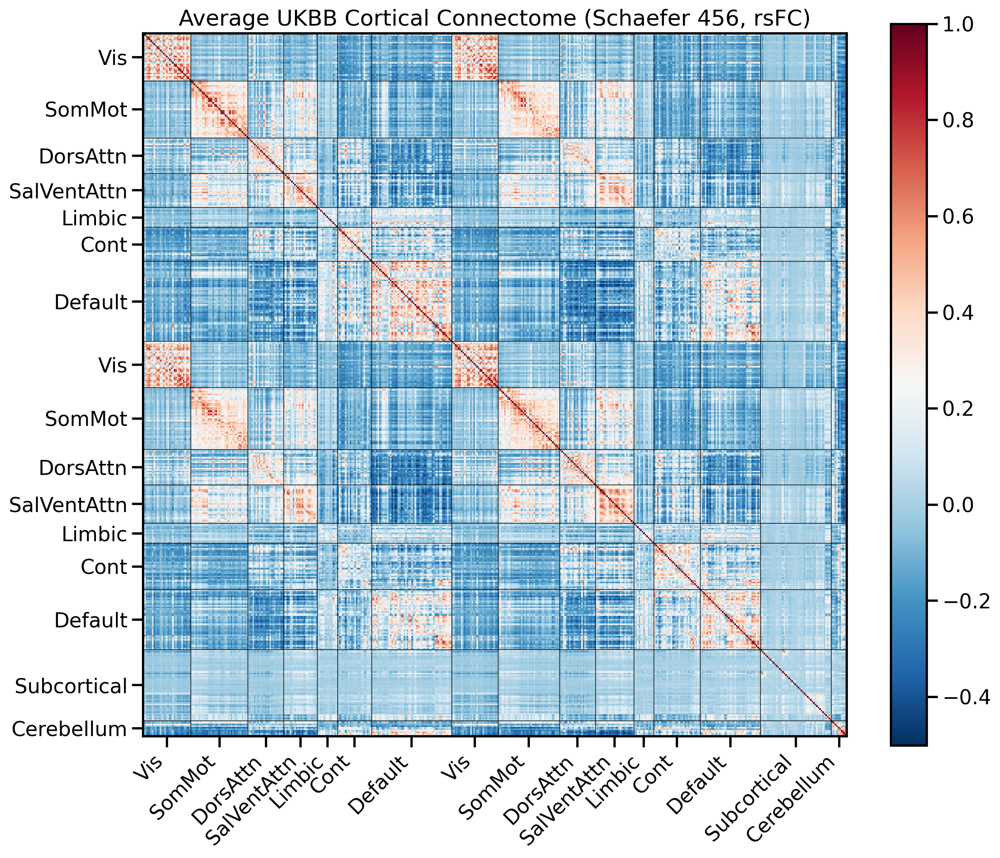

In [18]:
plot_connectome_with_networks(UKBB_S456_connectome_mu, network_labels=None, n_rois=456, title='Average UKBB Cortical Connectome (Schaefer 456, rsFC)')
plot_connectome_with_networks(UKBB_S456_connectome_mu, network_labels=schaef456_network_labels, n_rois=400, title='Average UKBB Cortical Connectome (Schaefer 400, rsFC)')
plot_connectome_with_networks(UKBB_S456_connectome_mu, network_labels=schaef456_network_labels, n_rois=456, title='Average UKBB Cortical Connectome (Schaefer 456, rsFC)')


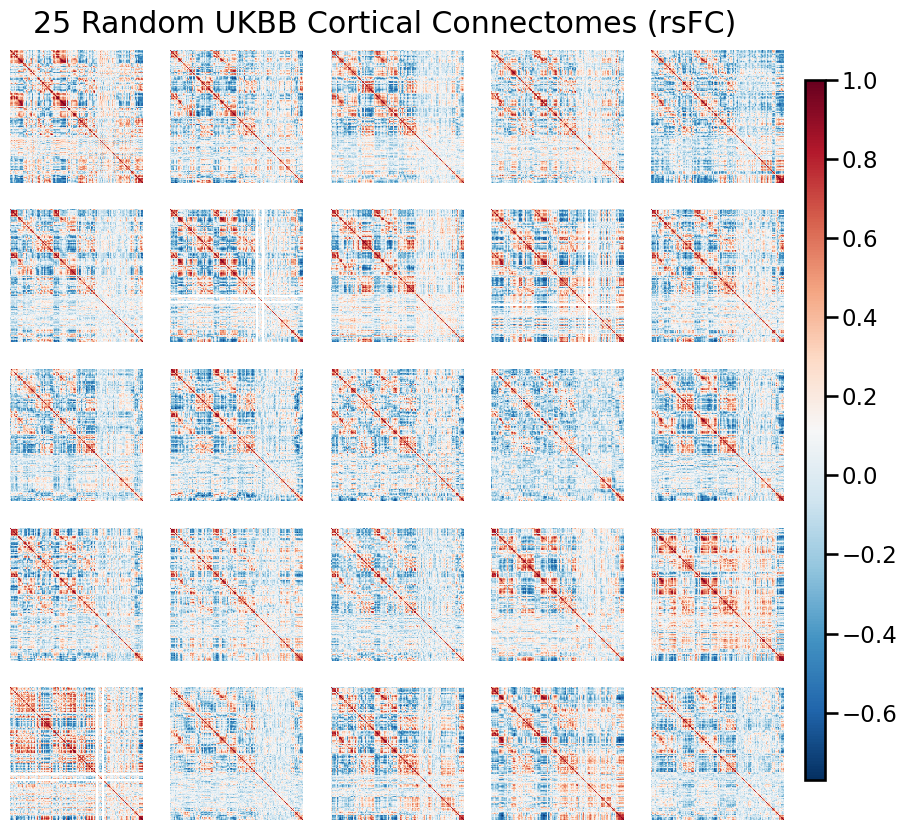

In [82]:
plot_random_connectomes(S156_connectomes, n_rows=5, max_rois=156)

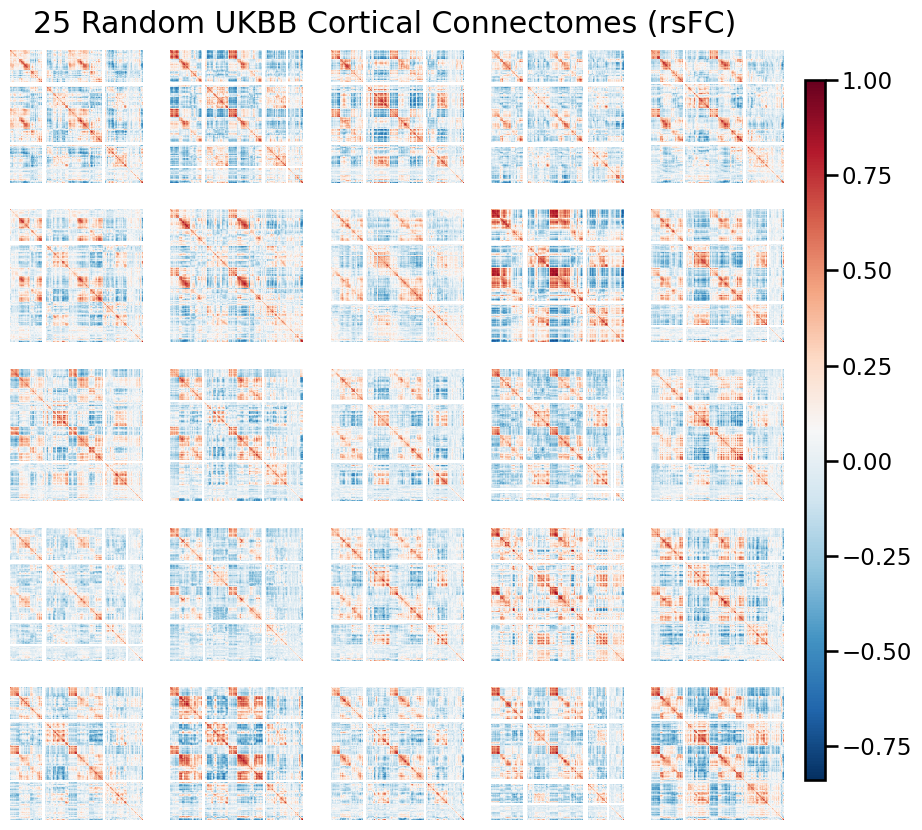

In [83]:
plot_random_connectomes(S456_connectomes, n_rows=5, max_rois=456)

## Evaluate stability

### Correlations

In [13]:
def calculate_connectome_correlations(connectomes):
    """
    Calculate correlations between each connectome and the population average.
    
    Args:
        connectomes (list): List of individual subject connectome matrices
        
    Returns:
        tuple: (mean correlation, overall p-value) if valid correlations exist,
               (None, None) otherwise
    """
    # Convert list of connectomes to array and calculate population average
    connectome_array = np.array(connectomes)
    pop_avg = np.mean(connectome_array, axis=0)
    
    # Calculate correlations between population average and each individual connectome
    correlations = []
    p_values = []
    for connectome in connectome_array:
        # Flatten the matrices to 1D arrays for correlation calculation
        pop_avg_flat = pop_avg.flatten()
        conn_flat = connectome.flatten()
        
        # Remove any pairs where either value is NaN or inf
        mask = ~(np.isnan(pop_avg_flat) | np.isnan(conn_flat) | 
                 np.isinf(pop_avg_flat) | np.isinf(conn_flat))
        pop_avg_clean = pop_avg_flat[mask]
        conn_clean = conn_flat[mask]
        
        if len(pop_avg_clean) > 0:  # Only calculate if we have valid data points
            try:
                # Calculate correlation and p-value
                corr, p_val = pearsonr(pop_avg_clean, conn_clean)
                print(f"Correlation: {corr:.3f}, p-value: {p_val:.3e}")
                correlations.append(corr)
                p_values.append(p_val)
            except Exception as e:
                print(f"Error calculating correlation: {str(e)}")
                continue

    if correlations:  # Only calculate statistics if we have valid correlations
        # Calculate mean correlation
        mean_corr = np.mean(correlations)
        # Calculate overall p-value using Fisher's method with all valid p-values
        overall_p = scipy.stats.combine_pvalues(p_values)[1]

        print(f"Mean correlation with population average: {mean_corr:.3f}")
        print(f"Overall p-value: {overall_p:.3e}")
        return mean_corr, overall_p
    else:
        print("No valid correlations could be calculated")
        return None, None

In [89]:
calculate_connectome_correlations(S156_connectomes)

Correlation: 0.692, p-value: 0.000e+00
Correlation: 0.693, p-value: 0.000e+00
Correlation: 0.674, p-value: 0.000e+00
Correlation: 0.666, p-value: 0.000e+00
Correlation: 0.679, p-value: 0.000e+00
Correlation: 0.676, p-value: 0.000e+00
Correlation: 0.778, p-value: 0.000e+00
Correlation: 0.719, p-value: 0.000e+00
Correlation: 0.729, p-value: 0.000e+00
Correlation: 0.682, p-value: 0.000e+00
Correlation: 0.617, p-value: 0.000e+00
Correlation: 0.767, p-value: 0.000e+00
Correlation: 0.568, p-value: 0.000e+00
Correlation: 0.730, p-value: 0.000e+00
Correlation: 0.669, p-value: 0.000e+00
Correlation: 0.641, p-value: 0.000e+00
Correlation: 0.729, p-value: 0.000e+00
Correlation: 0.632, p-value: 0.000e+00
Correlation: 0.644, p-value: 0.000e+00
Correlation: 0.668, p-value: 0.000e+00
Correlation: 0.741, p-value: 0.000e+00
Correlation: 0.516, p-value: 0.000e+00
Correlation: 0.723, p-value: 0.000e+00
Correlation: 0.593, p-value: 0.000e+00
Correlation: 0.680, p-value: 0.000e+00
Correlation: 0.713, p-val

  statistic = -2 * np.sum(np.log(pvalues))



Correlation: 0.654, p-value: 0.000e+00
Correlation: 0.687, p-value: 0.000e+00
Mean correlation with population average: 0.689
Overall p-value: 0.000e+00


(0.6889268655793458, 0.0)

In [90]:
calculate_connectome_correlations(S156_connectomes_clean)

Correlation: 0.692, p-value: 0.000e+00
Correlation: 0.695, p-value: 0.000e+00
Correlation: 0.674, p-value: 0.000e+00
Correlation: 0.661, p-value: 0.000e+00
Correlation: 0.779, p-value: 0.000e+00
Correlation: 0.722, p-value: 0.000e+00
Correlation: 0.729, p-value: 0.000e+00
Correlation: 0.687, p-value: 0.000e+00
Correlation: 0.616, p-value: 0.000e+00
Correlation: 0.771, p-value: 0.000e+00
Correlation: 0.565, p-value: 0.000e+00
Correlation: 0.736, p-value: 0.000e+00
Correlation: 0.665, p-value: 0.000e+00
Correlation: 0.643, p-value: 0.000e+00
Correlation: 0.731, p-value: 0.000e+00
Correlation: 0.646, p-value: 0.000e+00
Correlation: 0.667, p-value: 0.000e+00
Correlation: 0.745, p-value: 0.000e+00
Correlation: 0.523, p-value: 0.000e+00
Correlation: 0.728, p-value: 0.000e+00
Correlation: 0.588, p-value: 0.000e+00
Correlation: 0.681, p-value: 0.000e+00
Correlation: 0.731, p-value: 0.000e+00
Correlation: 0.692, p-value: 0.000e+00
Correlation: 0.685, p-value: 0.000e+00
Correlation: 0.685, p-val

(0.6964374992837251, 0.0)

In [91]:
calculate_connectome_correlations(S456_connectomes)

Correlation: 0.649, p-value: 0.000e+00
Correlation: 0.647, p-value: 0.000e+00
Correlation: 0.633, p-value: 0.000e+00
Correlation: 0.619, p-value: 0.000e+00
Correlation: 0.623, p-value: 0.000e+00
Correlation: 0.581, p-value: 0.000e+00
Correlation: 0.706, p-value: 0.000e+00
Correlation: 0.672, p-value: 0.000e+00
Correlation: 0.661, p-value: 0.000e+00
Correlation: 0.647, p-value: 0.000e+00
Correlation: 0.576, p-value: 0.000e+00
Correlation: 0.721, p-value: 0.000e+00
Correlation: 0.518, p-value: 0.000e+00
Correlation: 0.685, p-value: 0.000e+00
Correlation: 0.600, p-value: 0.000e+00
Correlation: 0.543, p-value: 0.000e+00
Correlation: 0.666, p-value: 0.000e+00
Correlation: 0.548, p-value: 0.000e+00
Correlation: 0.579, p-value: 0.000e+00
Correlation: 0.615, p-value: 0.000e+00
Correlation: 0.694, p-value: 0.000e+00
Correlation: 0.491, p-value: 0.000e+00
Correlation: 0.657, p-value: 0.000e+00
Correlation: 0.562, p-value: 0.000e+00
Correlation: 0.598, p-value: 0.000e+00
Correlation: 0.659, p-val

(0.6326201999493943, 0.0)

### Residuals

In [14]:
def compute_connectome_residuals(individual_connectomes, population_average, n_regions=None):
    """
    Compute residuals between individual connectomes and population average.
    
    Parameters:
    -----------
    individual_connectomes : list
        List of individual connectivity matrices
    population_average : numpy.ndarray 
        Population average connectivity matrix
    n_regions : int, optional
        Number of regions to include in analysis. If None, uses all regions (default None)
        
    Returns:
    --------
    numpy.ndarray
        1D array of flattened residuals
    """
    # Get max number of regions from population average shape
    max_regions = population_average.shape[0]
    
    # Use all regions if n_regions not specified or is larger than max
    n_regions = min(n_regions, max_regions) if n_regions is not None else max_regions
    
    # Select subset of regions
    subset_connectomes = [conn[:n_regions, :n_regions] for conn in individual_connectomes]
    pop_avg_subset = population_average[:n_regions, :n_regions]
    
    print(f"Original connectome shape: {individual_connectomes[0].shape}")
    print(f"Subset connectome shape: {subset_connectomes[0].shape}")

    # Convert to numpy array and compute residuals
    connectome_array = np.array(subset_connectomes)
    residuals = connectome_array - pop_avg_subset

    # Flatten residuals into 1D array
    return residuals.flatten()

def plot_residual_distribution(all_residuals):
    """
    Plot distribution of residuals between individual connectomes and population average.
    Tests and visualizes if the distribution is Gaussian.
    
    Parameters:
    -----------
    all_residuals : numpy.ndarray
        1D array of flattened residuals
    """
    # Create figure
    plt.figure(figsize=(12, 6))
    
    # Plot histogram without KDE
    sns.histplot(all_residuals, kde=False, stat='density', bins=100)
    
    # Fit normal distribution and plot
    mu, std = np.nanmean(all_residuals), np.nanstd(all_residuals)
    
    plt.title('Distribution of Residuals All Connectomes vs. Population Average')
    plt.xlabel('Residual Value')
    plt.ylabel('Density')
    plt.legend()
    
    # Perform Shapiro-Wilk test for normality
    statistic, p_value = stats.shapiro(all_residuals[~np.isnan(all_residuals)])
    
    # Add summary statistics and normality test results as text
    stats_text = f'Mean: {mu:.3f}\n'
    stats_text += f'Std: {std:.3f}\n'
    
    stats_text += f'\nShapiro-Wilk Test:\n'
    stats_text += f'Statistic: {statistic:.3f}\n'
    stats_text += f'p-value: {p_value:.3e}\n'
    stats_text += f'Distribution is {"Normal" if p_value > 0.05 else "Not Normal"}'
    
    plt.text(0.95, 0.95, stats_text,
             transform=plt.gca().transAxes,
             verticalalignment='top',
             horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.show()

In [100]:
all_S156_residuals = compute_connectome_residuals(S156_connectomes, UKBB_S156_connectome_mu)
all_S456_residuals = compute_connectome_residuals(S456_connectomes, UKBB_S456_connectome_mu)

Original connectome shape: (156, 156)
Subset connectome shape: (156, 156)
Original connectome shape: (456, 456)
Subset connectome shape: (456, 456)


  warnings.warn("p-value may not be accurate for N > 5000.")



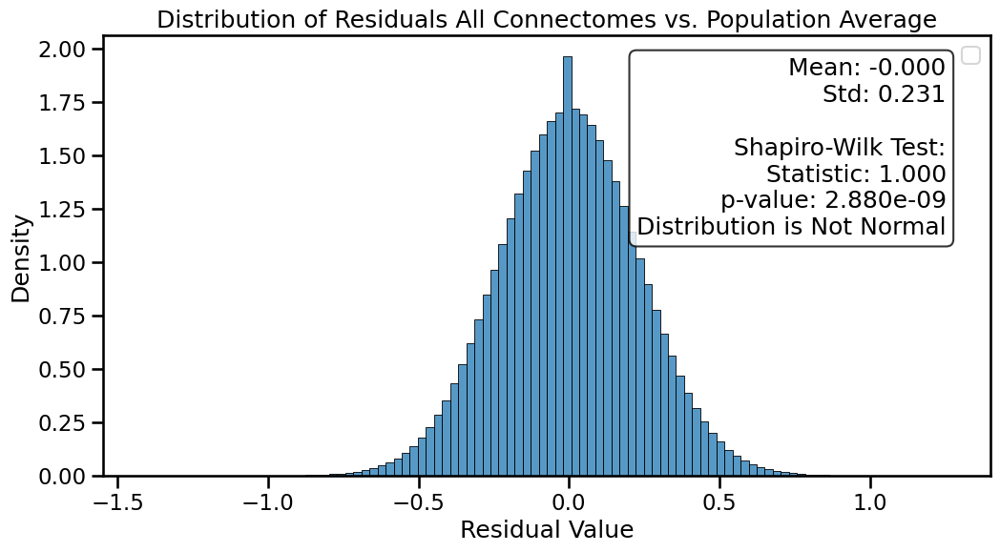

In [98]:
plot_residual_distribution(all_S156_residuals)

  warnings.warn("p-value may not be accurate for N > 5000.")



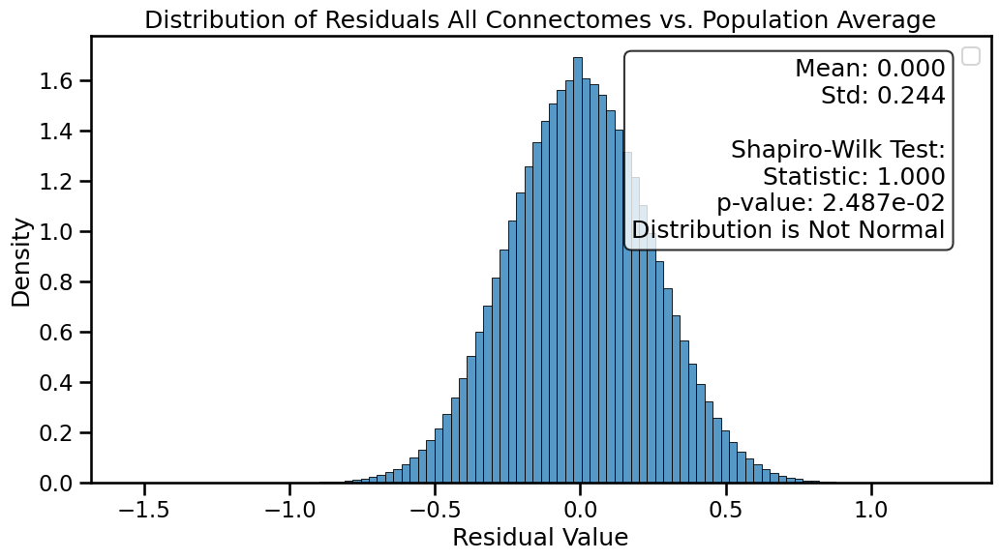

In [101]:
plot_residual_distribution(all_S456_residuals)

In [103]:
def plot_random_edge_distribution(connectomes, max_regions, avg_connectome):
    """
    Plot distribution of values for a random edge in the connectome and test for normality.
    
    Parameters:
    -----------
    connectomes : list
        List of connectivity matrices
    max_regions : int
        Number of regions to subset (e.g. first 100)
    avg_connectome : numpy.ndarray
        Population average connectome matrix
    """
    # Convert to numpy array and subset
    connectome_array = np.array(connectomes)
    n_subjects = len(connectome_array)
    
    # Get random indices for row and column within max_regions
    row_idx = np.random.randint(0, max_regions)
    col_idx = np.random.randint(0, max_regions)
    
    # Get distribution of values for this edge across subjects
    edge_values = connectome_array[:, row_idx, col_idx]
    
    # Perform Shapiro-Wilk test for normality
    statistic, p_value = stats.shapiro(edge_values)
    
    # Get max possible range from population average
    max_abs_val = np.max(np.abs(avg_connectome))
    x_range = (-max_abs_val, max_abs_val)
    
    # Create figure
    plt.figure(figsize=(10, 6))
    
    # Plot histogram with KDE
    sns.histplot(edge_values, kde=True, stat='count', bins=30)
    plt.xlim(x_range)
    
    # Add vertical line for population average
    avg_value = avg_connectome[row_idx, col_idx]
    plt.axvline(x=avg_value, color='r', linestyle='--', 
                label=f'Population Average: {avg_value:.3f}')
    
    plt.title(f'Distribution of Edge Values for Regions ({row_idx}, {col_idx})')
    plt.xlabel('Connectivity Value')
    plt.ylabel('Count')
    plt.legend()
    
    # Adjust layout to prevent text cutoff
    plt.tight_layout()
    plt.subplots_adjust(right=0.85)
    plt.show()

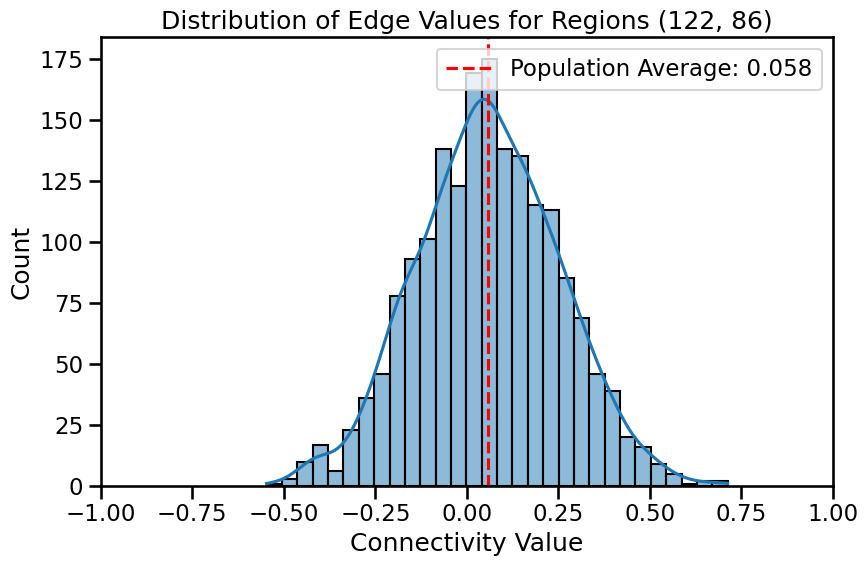

In [104]:
plot_random_edge_distribution(S156_connectomes, 156, UKBB_S156_connectome_mu)

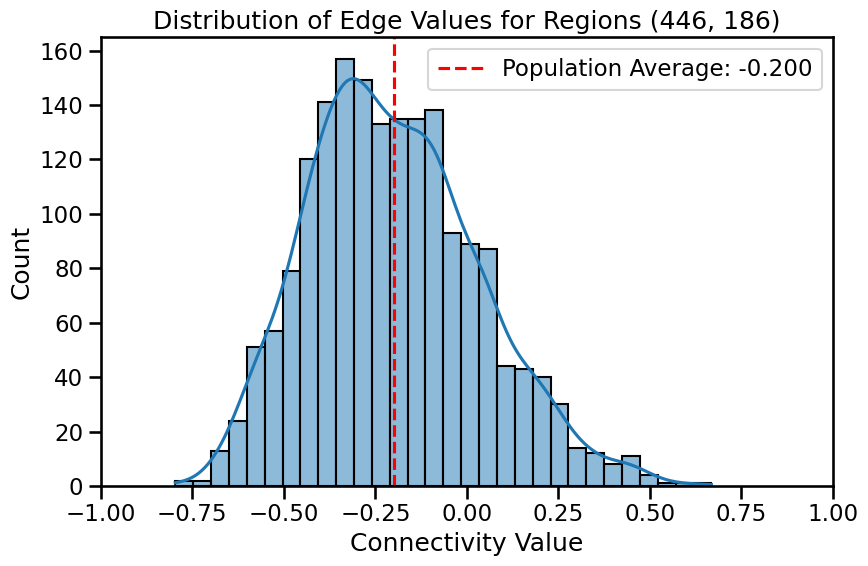

In [105]:
plot_random_edge_distribution(S456_connectomes, 456, UKBB_S456_connectome_mu)

### Connectome subset KDEs

In [20]:
def plot_edge_distributions(connectomes, max_regions, avg_connectome):
    """
    Plot KDE distributions for all edges in the upper triangle of the connectome.
    
    Parameters:
    -----------
    connectomes : list
        List of connectivity matrices
    max_regions : int
        Number of regions to subset (e.g. first 10)
    avg_connectome : numpy.ndarray
        Population average connectome matrix
    """
    # Convert to numpy array and subset
    connectome_array = np.array(connectomes)
    n_subjects = len(connectome_array)
    
    # First plot the subsetted connectome
    subset_connectome = avg_connectome[:max_regions, :max_regions]
    
    # Create mask for upper triangle
    mask = np.tril(np.ones_like(subset_connectome))
    
    # Create masked array
    masked_connectome = np.ma.array(subset_connectome, mask=mask)
    
    plt.figure(figsize=(12, 10), dpi=200)
    plt.imshow(masked_connectome, cmap='RdBu_r', vmin=-1, vmax=1)
    plt.colorbar()
    plt.title(f'Average Cortical Connectome Subset (First {max_regions} regions)')
    
    # Set integer ticks
    plt.xticks(range(0, max_regions, 10))
    plt.yticks(range(0, max_regions, 10))
    
    plt.show()
    
    # KDE part
    # Create figure with subplots for upper triangle
    n_plots = (max_regions * (max_regions - 1)) // 2  # Number of edges in upper triangle
    n_rows = max_regions - 1
    n_cols = max_regions - 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 24))  # Made height equal to width
    
    # Get max possible range from population average for consistent scaling
    max_abs_val = np.max(np.abs(avg_connectome))
    x_range = (-max_abs_val, max_abs_val)
    
    # Plot KDE for each edge in upper triangle
    plot_idx = 0
    for i in range(max_regions):
        for j in range(i+1, max_regions):
            # Get row and column index in subplot grid
            row = i
            col = j-1
            
            # Get distribution of values for this edge across subjects
            edge_values = connectome_array[:, i, j]
            
            # Get average value for background color
            avg_value = avg_connectome[i, j]
            
            # Set background color based on average value
            axes[row, col].set_facecolor(plt.cm.RdBu_r((avg_value + 1) / 2))
            
            # Plot KDE without labels and without black borders
            sns.kdeplot(edge_values, ax=axes[row, col], color='black', linewidth=1)
            axes[row, col].spines['top'].set_visible(False)
            axes[row, col].spines['right'].set_visible(False)
            axes[row, col].spines['bottom'].set_visible(False)
            axes[row, col].spines['left'].set_visible(False)
            axes[row, col].set_xlim(x_range)
            
            # Make subplot square by setting aspect ratio to 'equal'
            axes[row, col].set_aspect(1.0/axes[row, col].get_data_ratio())
            
            # Add vertical line for population average
            axes[row, col].axvline(x=avg_value, color='blue', linestyle='--')
            
            # Remove all labels and ticks
            axes[row, col].set_xticks([])
            axes[row, col].set_yticks([])
            axes[row, col].set_xlabel('')
            axes[row, col].set_ylabel('')
            
            plot_idx += 1
    
    # Remove empty subplots in lower triangle
    for i in range(n_rows):
        for j in range(n_cols):
            if j <= i:
                axes[i,j].remove()
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

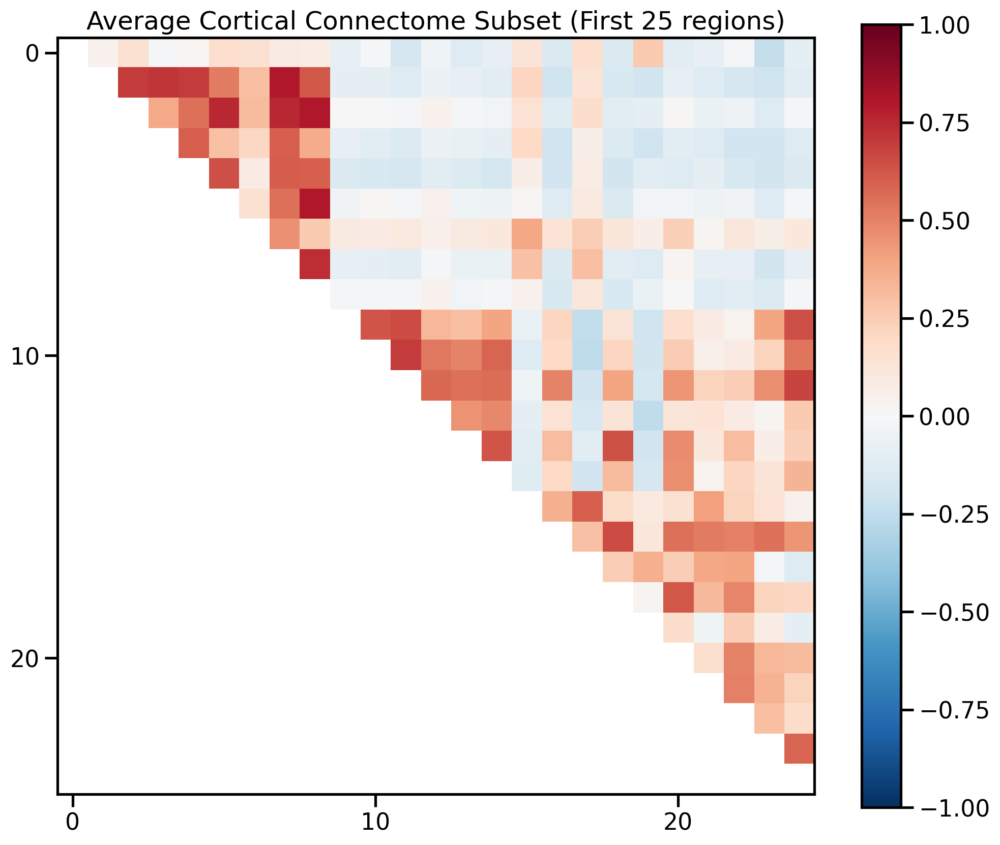

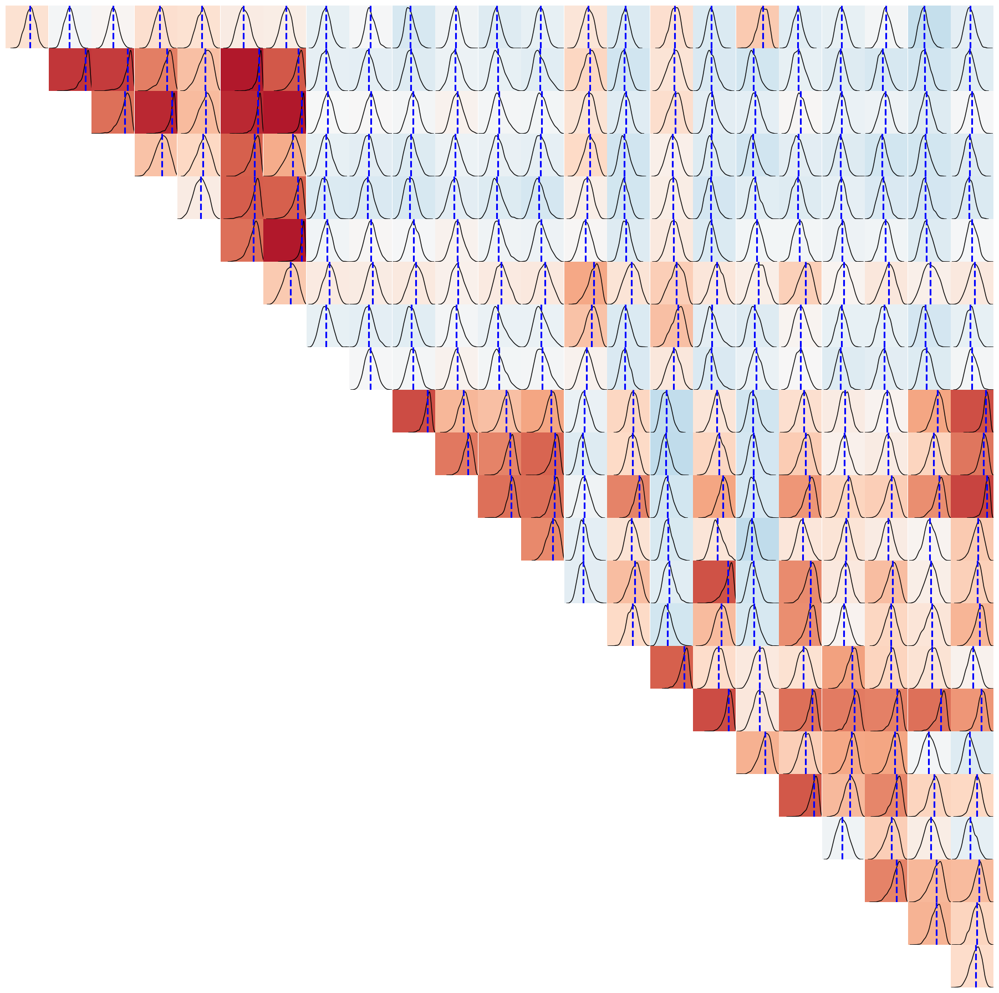

In [21]:
plot_edge_distributions(S156_connectomes, 25, UKBB_S156_connectome_mu)

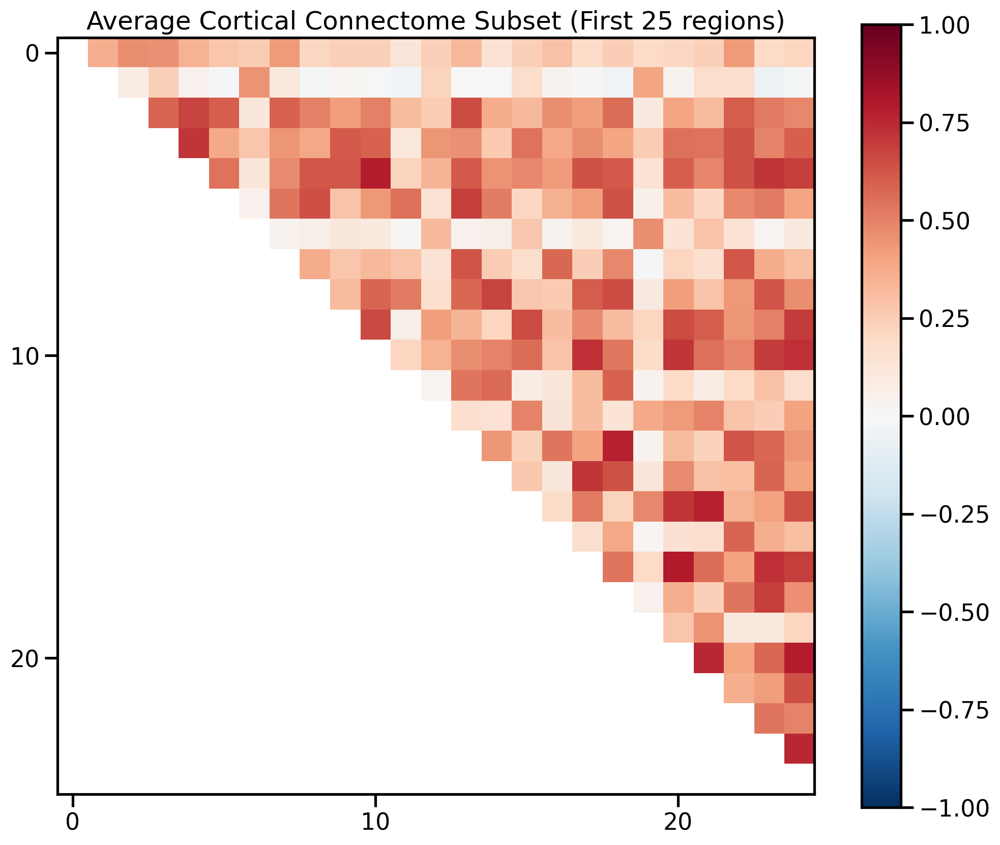

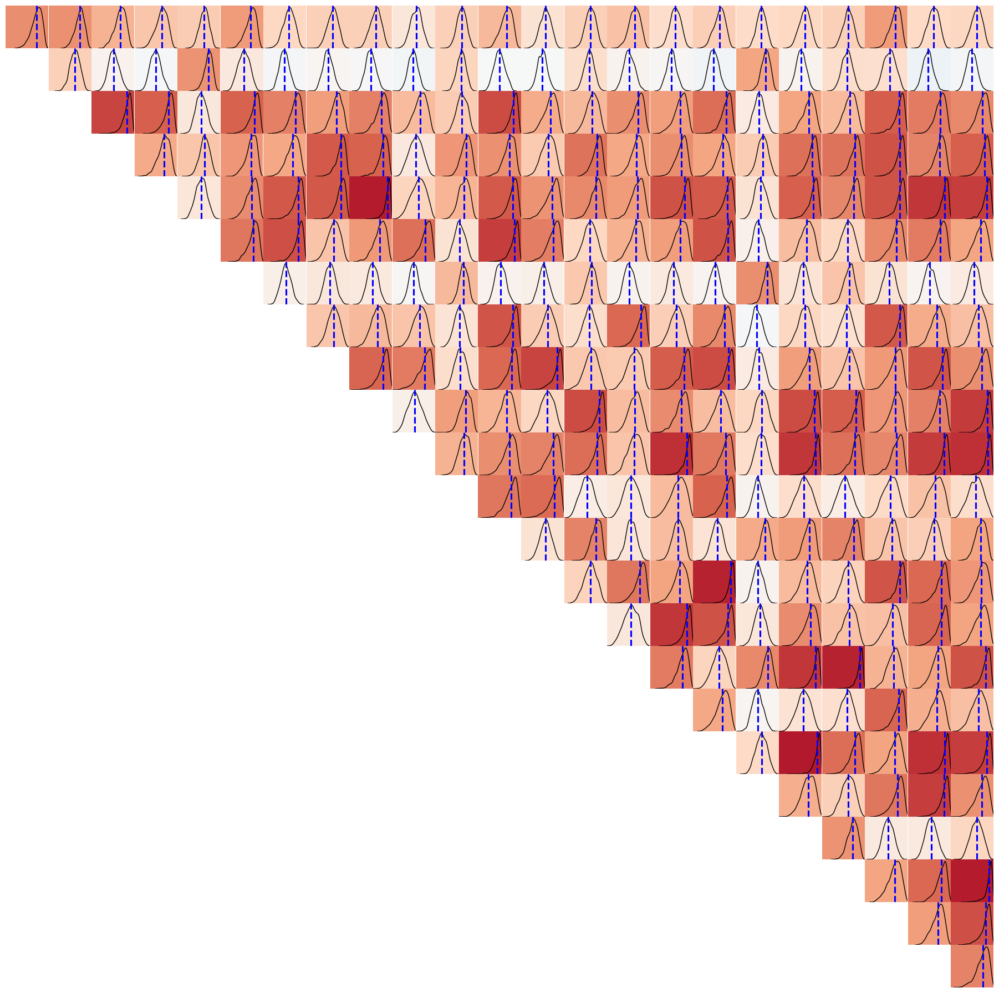

In [22]:
plot_edge_distributions(S456_connectomes, 25, UKBB_S456_connectome_mu)

### Variance

In [33]:
def analyze_connectome_variance(connectomes, avg_connectome, n_regions=None, percentile=20):
    """
    Analyze and plot variance patterns in connectome data.
    
    Args:
        connectomes (list): List of individual subject connectome matrices
        avg_connectome (np.ndarray): Population average connectome matrix
        n_regions (int, optional): Number of regions to subset. If None, use full matrices
        percentile (float): Percentile cutoff for low variance connections (e.g. 20 means keep lowest 20%)
    """
    # Subset matrices if n_regions specified
    if n_regions is not None:
        connectomes = [conn[:n_regions, :n_regions] for conn in connectomes]
        avg_connectome = avg_connectome[:n_regions, :n_regions]
    
    # Convert to array and calculate variance
    connectome_array = np.array(connectomes)
    variance_matrix = np.nanvar(connectome_array, axis=0)
    
    # Plot variance matrix
    plt.figure(figsize=(12, 10), dpi=200)
    plt.imshow(variance_matrix, cmap='Reds')
    plt.colorbar(label='Variance')
    roi_str = f"{variance_matrix.shape[0]} ROIs"
    plt.title(f'Variance of Connections Across Subjects ({roi_str})')
    plt.show()

    # Calculate variance threshold based on percentile
    var_threshold = np.nanpercentile(variance_matrix, percentile)
    
    # Create and plot masked connectome
    low_var_mask = variance_matrix < var_threshold
    masked_connectome = avg_connectome.copy()
    masked_connectome[~low_var_mask] = np.nan

    # Plot full average connectome
    plt.figure(figsize=(12, 10), dpi=200)
    plt.imshow(avg_connectome, cmap='RdBu_r')
    plt.colorbar(label='Correlation')
    plt.title(f'Average UKBB Cortical Connectome ({roi_str}, rsFC)')
    plt.show()
    
    # Plot masked connectome
    plt.figure(figsize=(12, 10), dpi=200)
    plt.imshow(masked_connectome, cmap='RdBu_r')
    plt.colorbar(label='Correlation')
    plt.title(f'Population Average Connectome\n(Only Showing Lowest {percentile}% Variance Connections)')
    plt.show()

    # Calculate edge distribution statistics
    total_elements = masked_connectome.size
    nan_elements = np.isnan(masked_connectome).sum()
    valid_elements = total_elements - nan_elements

    # Get valid (non-NaN) elements
    valid_values = masked_connectome[~np.isnan(masked_connectome)]

    # Count edges in different ranges
    strong_pos = np.sum(valid_values > 0.2)
    weak = np.sum((valid_values >= -0.2) & (valid_values <= 0.2))
    strong_neg = np.sum(valid_values < -0.2)
    
    print(f"Low variance connections: {valid_elements} out of {total_elements} possible ({(valid_elements/total_elements*100):.2f}%)")
    print(f"\nEdge type distribution:")
    print(f"Strong positive (>0.2): {strong_pos} edges")
    print(f"  {strong_pos/valid_elements*100:.1f}% of low variance edges")
    print(f"  {strong_pos/total_elements*100:.1f}% of all possible edges")
    print(f"Weak (-0.2 to 0.2): {weak} edges") 
    print(f"  {weak/valid_elements*100:.1f}% of low variance edges")
    print(f"  {weak/total_elements*100:.1f}% of all possible edges")
    print(f"Strong negative (<-0.2): {strong_neg} edges")
    print(f"  {strong_neg/valid_elements*100:.1f}% of low variance edges")
    print(f"  {strong_neg/total_elements*100:.1f}% of all possible edges")

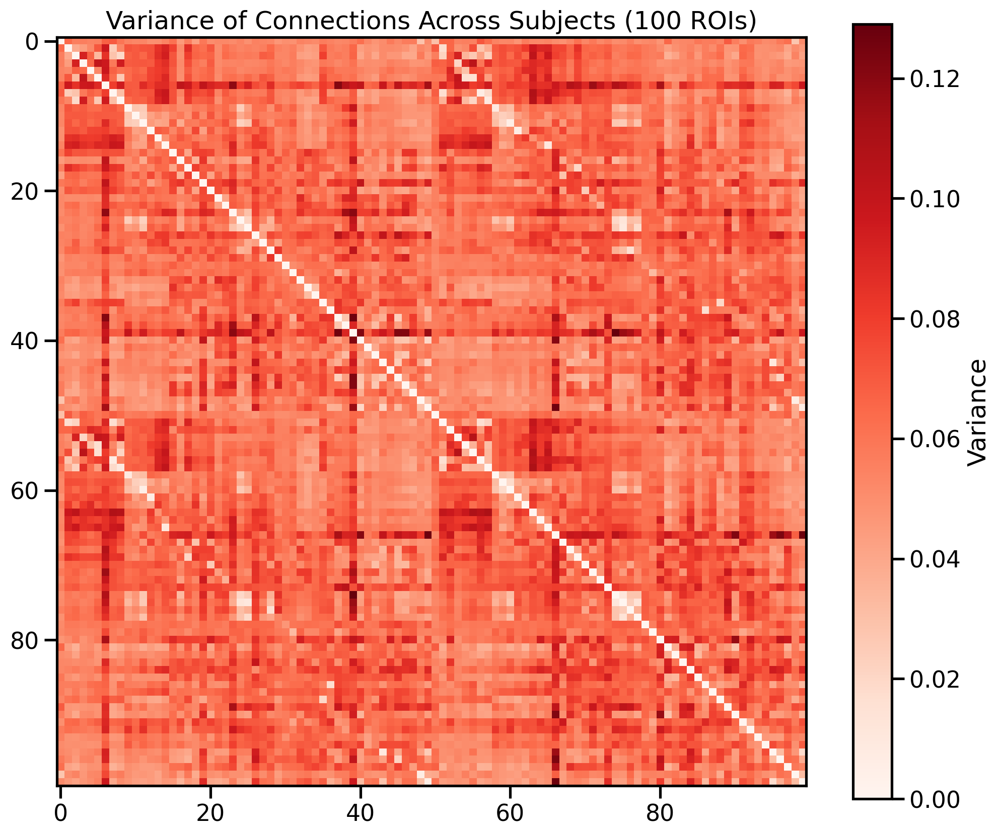

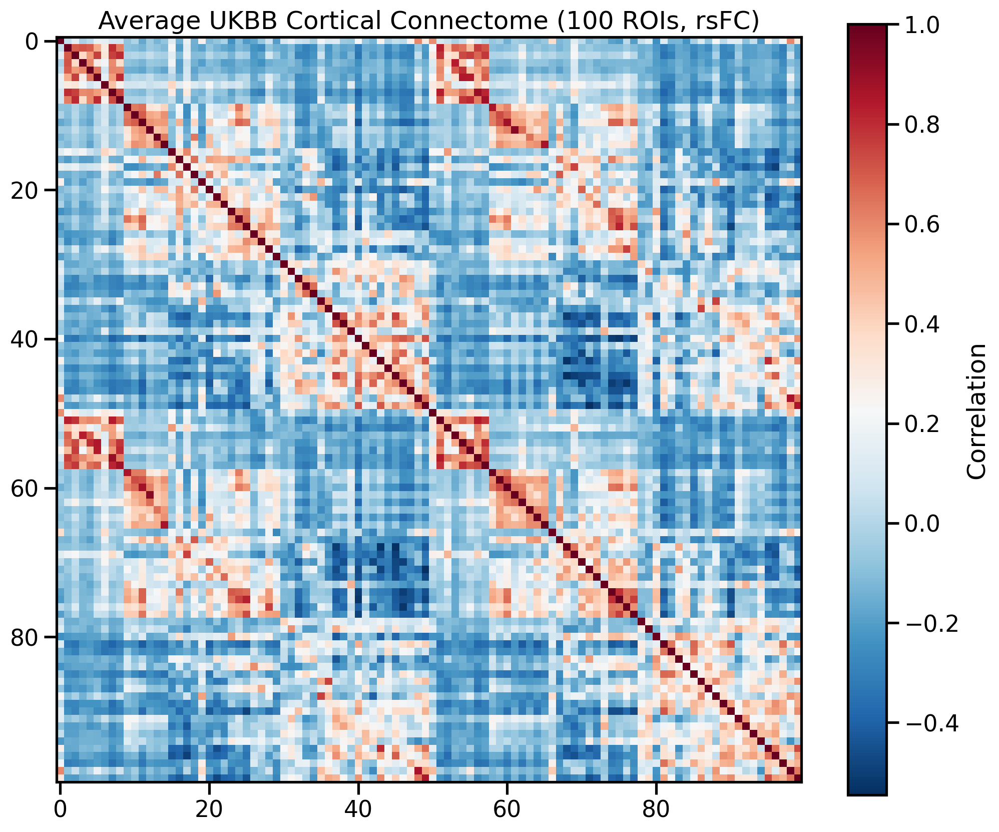

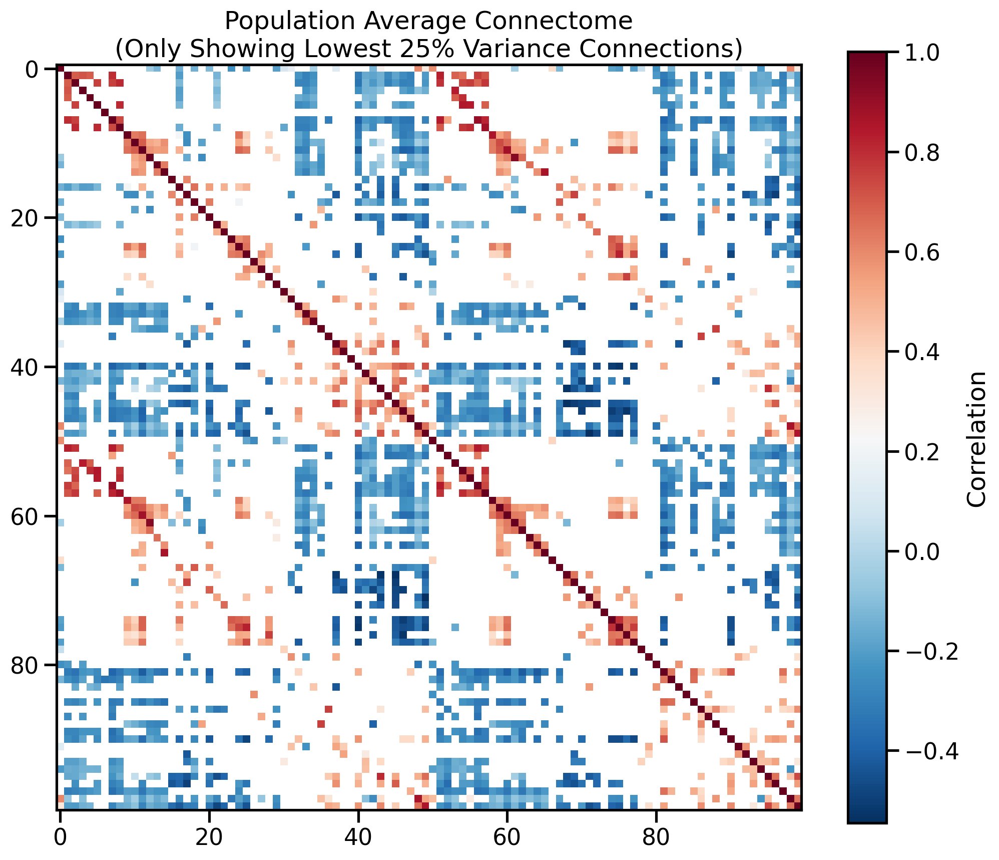

Low variance connections: 2500 out of 10000 possible (25.00%)

Edge type distribution:
Strong positive (>0.2): 828 edges
  33.1% of low variance edges
  8.3% of all possible edges
Weak (-0.2 to 0.2): 494 edges
  19.8% of low variance edges
  4.9% of all possible edges
Strong negative (<-0.2): 1178 edges
  47.1% of low variance edges
  11.8% of all possible edges


In [37]:
# Analyze full connectome
analyze_connectome_variance(S156_connectomes, UKBB_S156_connectome_mu, n_regions=100, percentile=25)


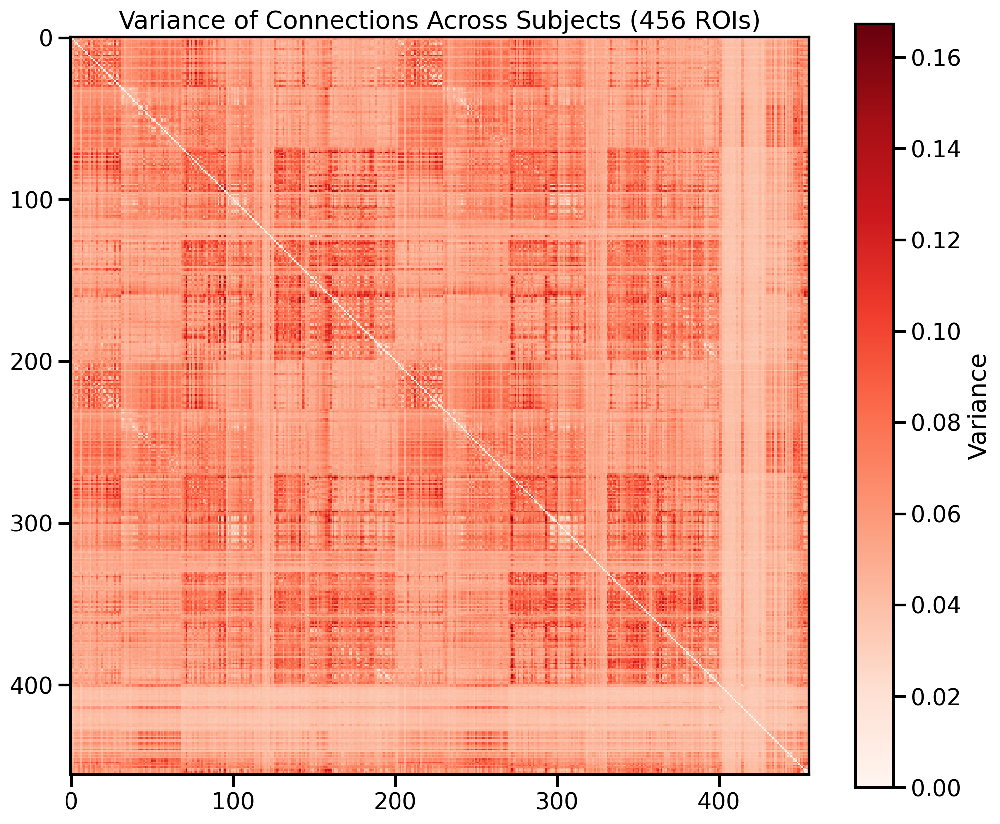

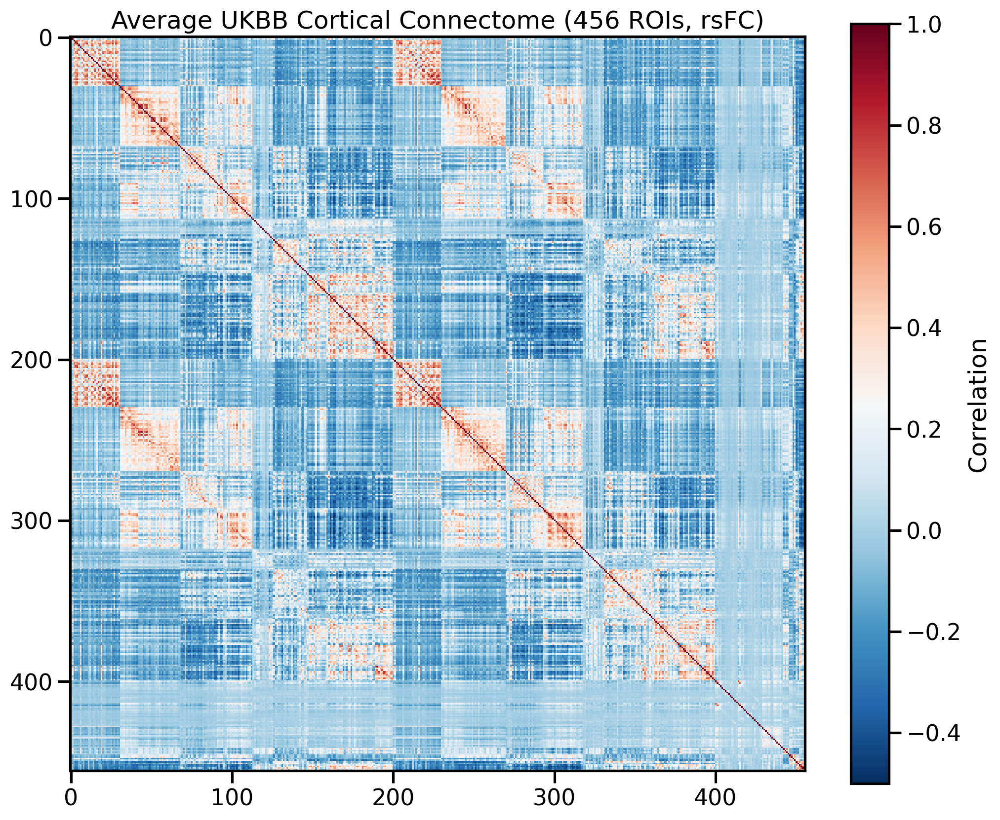

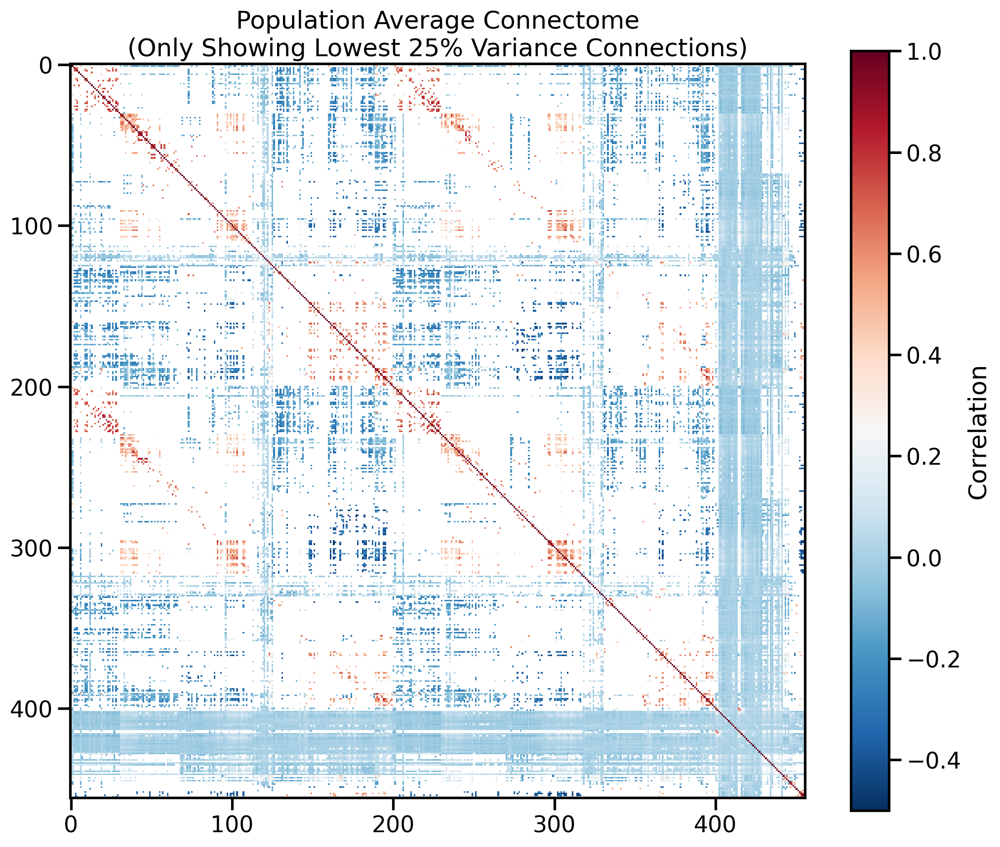

Low variance connections: 51984 out of 207936 possible (25.00%)

Edge type distribution:
Strong positive (>0.2): 4526 edges
  8.7% of low variance edges
  2.2% of all possible edges
Weak (-0.2 to 0.2): 42396 edges
  81.6% of low variance edges
  20.4% of all possible edges
Strong negative (<-0.2): 5062 edges
  9.7% of low variance edges
  2.4% of all possible edges


In [36]:
analyze_connectome_variance(S456_connectomes, UKBB_S456_connectome_mu, n_regions=456, percentile=25)

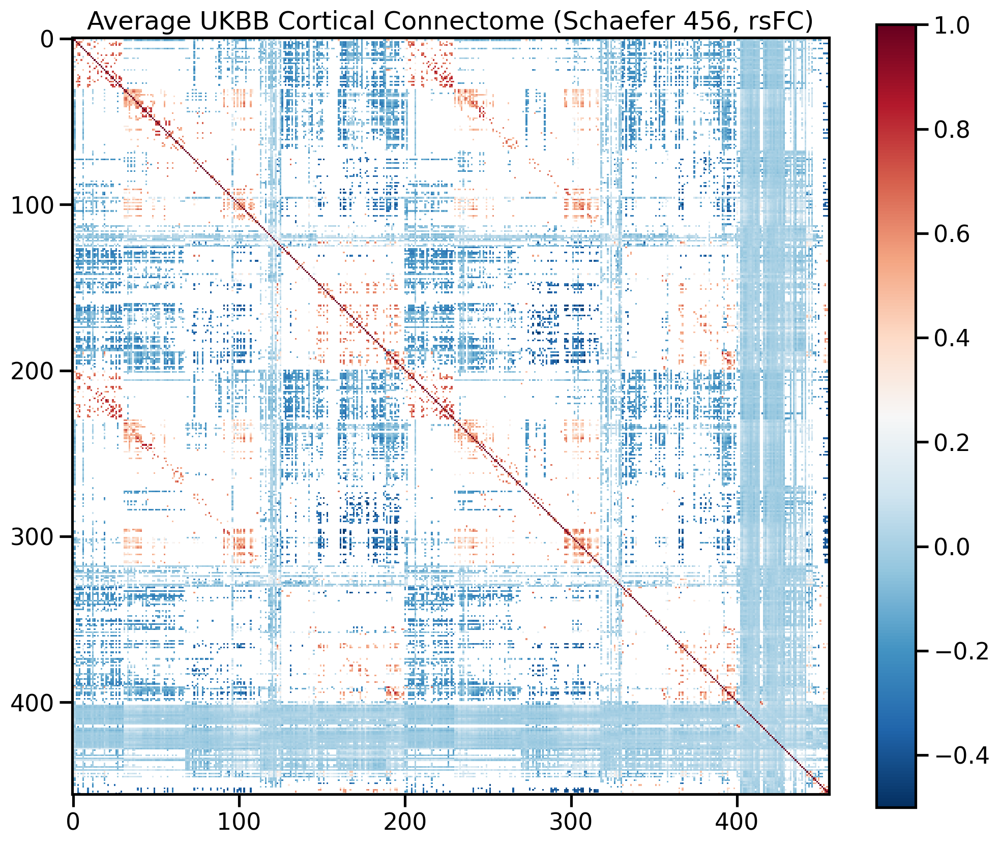

Low variance connections: 65978 out of 207936 possible (31.73%)

Edge type distribution:
Strong positive (>0.2): 5574 edges
  8.4% of valid edges
  2.7% of all possible edges
Weak (-0.2 to 0.2): 53268 edges
  80.7% of valid edges
  25.6% of all possible edges
Strong negative (<-0.2): 7136 edges
  10.8% of valid edges
  3.4% of all possible edges


In [62]:
avg_connectome = UKBB_S456_connectome_all

# Convert to array and calculate variance
connectome_array = np.array(all_S456_connectomes)
variance_matrix = np.nanvar(connectome_array, axis=0)

var_threshold=0.05

# Create and plot masked connectome
low_var_mask = variance_matrix < var_threshold
masked_connectome = avg_connectome.copy()
masked_connectome[~low_var_mask] = np.nan

S456_lowvar_avg_connectome = masked_connectome



plt.figure(figsize=(12, 10), dpi=200)
plt.imshow(S456_lowvar_avg_connectome, cmap='RdBu_r')
plt.colorbar() 
plt.title('Average UKBB Cortical Connectome (Schaefer 456, rsFC)')
plt.show()

# Calculate sparsity and edge distribution statistics
total_elements = S456_lowvar_avg_connectome.size
nan_elements = np.isnan(S456_lowvar_avg_connectome).sum()
valid_elements = total_elements - nan_elements

sparsity = nan_elements / total_elements * 100

# Get valid (non-NaN) elements
valid_values = S456_lowvar_avg_connectome[~np.isnan(S456_lowvar_avg_connectome)]

# Count edges in different ranges
strong_pos = np.sum(valid_values > 0.2)
weak = np.sum((valid_values >= -0.2) & (valid_values <= 0.2))
strong_neg = np.sum(valid_values < -0.2)

print(f"Low variance connections: {valid_elements} out of {total_elements} possible ({(valid_elements/total_elements*100):.2f}%)")
print(f"\nEdge type distribution:")
print(f"Strong positive (>0.2): {strong_pos} edges")
print(f"  {strong_pos/valid_elements*100:.1f}% of valid edges")
print(f"  {strong_pos/total_elements*100:.1f}% of all possible edges")
print(f"Weak (-0.2 to 0.2): {weak} edges") 
print(f"  {weak/valid_elements*100:.1f}% of valid edges")
print(f"  {weak/total_elements*100:.1f}% of all possible edges")
print(f"Strong negative (<-0.2): {strong_neg} edges")
print(f"  {strong_neg/valid_elements*100:.1f}% of valid edges")
print(f"  {strong_neg/total_elements*100:.1f}% of all possible edges")